# Test uniformity of HoloAmpAg hologram with Halpha filter scanning
==================================================================================================

- author : Jérémy Neveu
- date   : June 9th 2017


In [1]:
%%javascript
var kernel = IPython.notebook.kernel;
var thename = window.document.getElementById("notebook_name").innerHTML;
var command = "theNotebook = " + "'"+thename+"'";
kernel.execute(command);

<IPython.core.display.Javascript object>

In [2]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

print theNotebook
from IPython.display import Image, display
import sys
sys.path.append("../../common_tools/")
from common_notebook import *

init_notebook()

ScanHoloAmpAg_Halpha
ccdproc version 1.2.0
bottleneck version 1.2.0
/Users/jneveu/Documents/LSST/Calibration/CTIOAnaJun2017/ana_09jun17/ScanHoloAmpAg_Halpha


### Input directory

In [100]:
inputdir="../OverScanRemove/trim_images"
#inputdir="../../data/CTIODataJune2017_reducedRed/data_09jun17/"
MIN_IMGNUMBER=316
MAX_IMGNUMBER=340
date = "20170609"
tag = "trim"
holo_name = "HoloAmAg"
object_name='HD111980'
SelectTagRe='^%s_%s_([0-9]+).fits$' % (tag,date) # regular expression to select the file
SearchTagRe='^%s_%s_[0-9]+.fits$' % (tag,date)
NBIMGPERROW=2

### Output directories

In [4]:
dir_top_images="images_notebooks/"+theNotebook ### Top directory to save images
ensure_dir(dir_top_images) # create that directory

outputdir="./cut_fitsimages"
ensure_dir(outputdir)

## Location of the spectra
----------------------------------

In [5]:
dirlist_all = [inputdir]
sorted_numbers,sorted_files = MakeFileList(dirlist_all,MIN_IMGNUMBER,MAX_IMGNUMBER,SelectTagRe,SearchTagRe) 

all_dates,all_airmass,all_images,all_titles,all_header,all_expo,all_filt=BuildImages(sorted_files,sorted_numbers,object_name)

print 'Number of images:',len(all_images)

Number of images: 25


### Show images

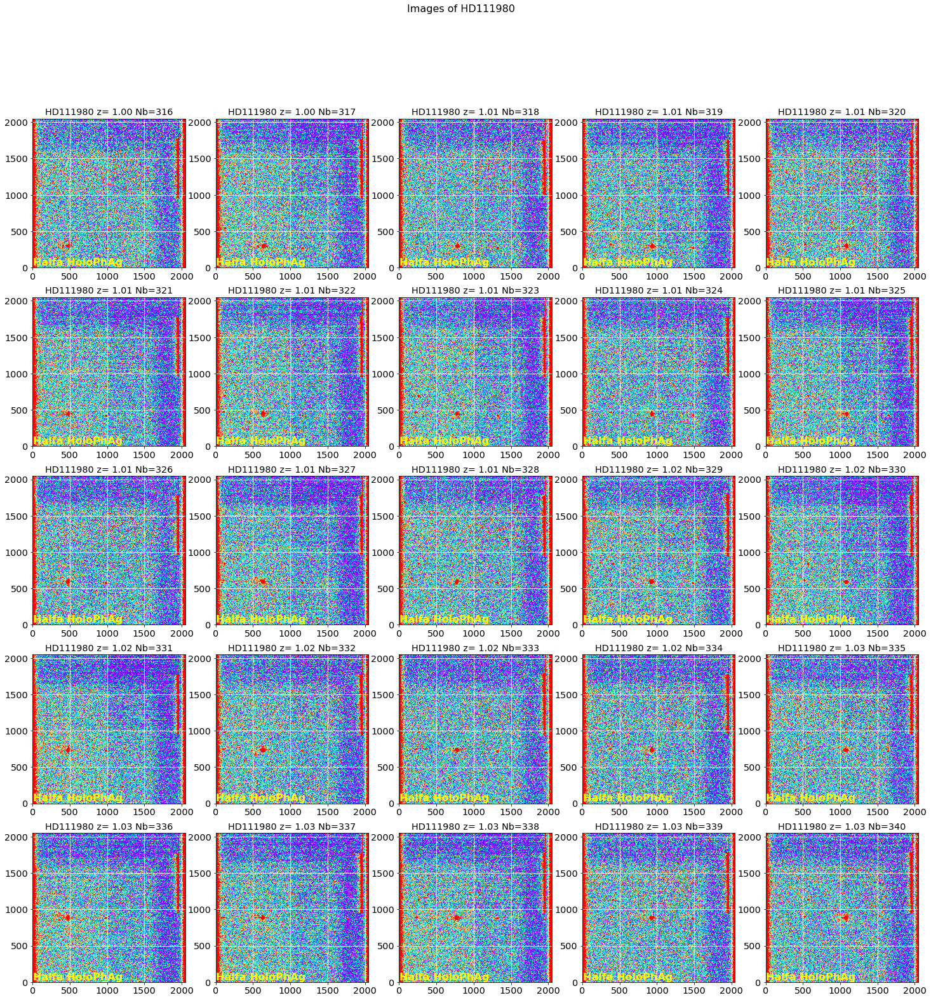

In [6]:
ShowImages(all_images,all_titles,all_filt,object_name,NBIMGPERROW=5,vmin=0,vmax=20,downsampling=1,verbose=False)

figfilename=os.path.join(dir_top_images,'input_images.pdf')
plt.savefig(figfilename)   

### Show histograms

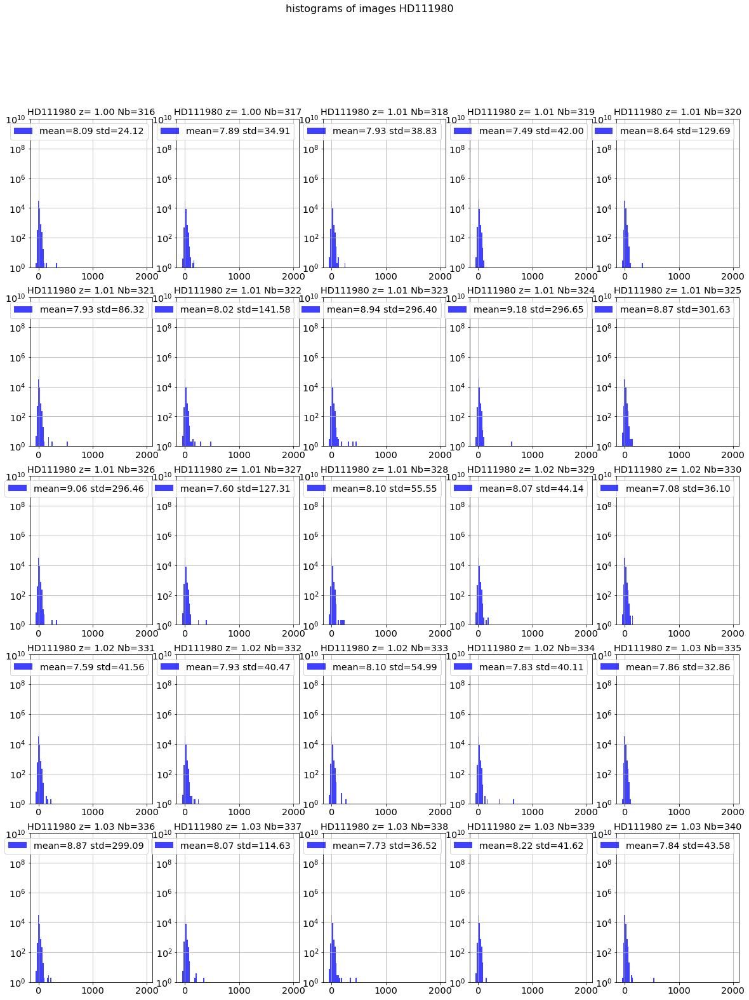

In [7]:
ShowHistograms(all_images,all_titles,all_filt,object_name,
               NBIMGPERROW=5,bins=100,range=(-50,2000),downsampling=10,verbose=False)

### Cut the images

To extract the spectra to analyze

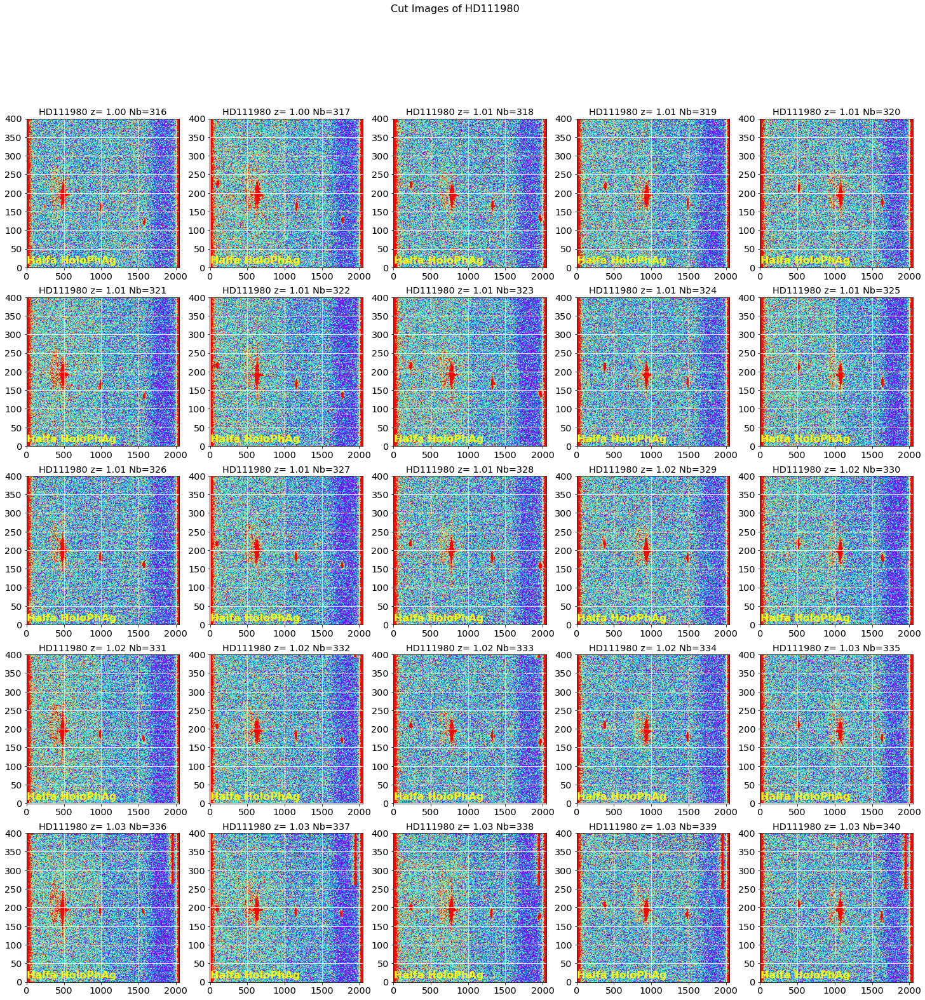

In [8]:
x_guess = [490,  650, 800, 950, 1100]*5
y_guess = [[300]*5, [450]*5, [590]*5, [740]*5, [890]*5]
y_guess = [val for sublist in y_guess for val in sublist]
DeltaY=[200]*len(all_images)
DeltaX=[2000]*len(all_images)  # must be very large to be able to compute incident angle

images_raw=ShowCenterImages(x_guess,y_guess,DeltaX,DeltaY,all_images,all_titles,all_filt,object_name,NBIMGPERROW=5,vmin=0,vmax=20)
figfilename=os.path.join(dir_top_images,'cut_images.pdf')
plt.savefig(figfilename)   

In [ ]:
# Raw right order
x_guess_rightorder = [990,  1150, 1300, 1450, 1600]*5
y_guess_rightorder = [200]*25
DeltaY_rightorder=[70]*len(all_images)
DeltaX_rightorder=[70]*len(all_images)  # must be very large to be able to compute incident angle
tmp=ShowCenterImages(x_guess_rightorder,y_guess_rightorder,DeltaX_rightorder,DeltaY_rightorder,images_raw,all_titles,all_filt,object_name,NBIMGPERROW=5,vmin=0,vmax=2000)

### Save cut images

In [9]:
newfullfilenames=[]
for idx,file in np.ndenumerate(sorted_files):
    short_infilename=file.split("/")[-1]
    print short_infilename
    short_partfilename=re.findall('^%s_(.*)' % tag,short_infilename)
    short_outfilename='cutimg_'+short_partfilename[0]
    newfullfilename=os.path.join(outputdir,short_outfilename)
    newfullfilenames.append(newfullfilename)
    
for idx,file in np.ndenumerate(newfullfilenames):
    prihdu = fits.PrimaryHDU(header=all_header[idx[0]],data=images_raw[idx[0]])
    thdulist = fits.HDUList(prihdu)
    thdulist.writeto(file,overwrite=True)

trim_20170609_316.fits
trim_20170609_317.fits
trim_20170609_318.fits
trim_20170609_319.fits
trim_20170609_320.fits
trim_20170609_321.fits
trim_20170609_322.fits
trim_20170609_323.fits
trim_20170609_324.fits
trim_20170609_325.fits
trim_20170609_326.fits
trim_20170609_327.fits
trim_20170609_328.fits
trim_20170609_329.fits
trim_20170609_330.fits
trim_20170609_331.fits
trim_20170609_332.fits
trim_20170609_333.fits
trim_20170609_334.fits
trim_20170609_335.fits
trim_20170609_336.fits
trim_20170609_337.fits
trim_20170609_338.fits
trim_20170609_339.fits
trim_20170609_340.fits


In [10]:
!ls -l cut_fitsimages/*

-rw-r--r--  1 jneveu  staff  6566400  9 aoû 17:17 cut_fitsimages/cutimg_20170609_316.fits
-rw-r--r--  1 jneveu  staff  6566400  9 aoû 17:17 cut_fitsimages/cutimg_20170609_317.fits
-rw-r--r--  1 jneveu  staff  6566400  9 aoû 17:17 cut_fitsimages/cutimg_20170609_318.fits
-rw-r--r--  1 jneveu  staff  6566400  9 aoû 17:17 cut_fitsimages/cutimg_20170609_319.fits
-rw-r--r--  1 jneveu  staff  6566400  9 aoû 17:17 cut_fitsimages/cutimg_20170609_320.fits
-rw-r--r--  1 jneveu  staff  6566400  9 aoû 17:17 cut_fitsimages/cutimg_20170609_321.fits
-rw-r--r--  1 jneveu  staff  6566400  9 aoû 17:17 cut_fitsimages/cutimg_20170609_322.fits
-rw-r--r--  1 jneveu  staff  6566400  9 aoû 17:17 cut_fitsimages/cutimg_20170609_323.fits
-rw-r--r--  1 jneveu  staff  6566400  9 aoû 17:17 cut_fitsimages/cutimg_20170609_324.fits
-rw-r--r--  1 jneveu  staff  6566400  9 aoû 17:17 cut_fitsimages/cutimg_20170609_325.fits
-rw-r--r--  1 jneveu  staff  6566400  9 aoû 17:17 cut_fitsimages/cutimg_20170609_326.fits
-rw-r--r--

# Find the optimal rotation of the spectra
============================

In [11]:
inputdir="./cut_fitsimages"
SelectTagRe='^cutimg_%s_([0-9]+).fits$' % date # regular expression to select the file
SearchTagRe='^cutimg_%s_[0-9]+.fits$' % date

outputdir="./rotated_fitsimages"
ensure_dir(outputdir)

In [12]:
sorted_numbers,sorted_files = MakeFileList([inputdir],MIN_IMGNUMBER,MAX_IMGNUMBER,SelectTagRe,SearchTagRe) 

all_dates,all_airmass,all_images,all_titles,all_header,all_expo,all_filt=BuildImages(sorted_files,sorted_numbers,object_name)

print 'Number of images:',len(all_images)

Number of images: 25


## Find rotation by Hessian analysis

La méthode s'inspire des techniques de détection de filmanents dans le milieu interstellaire.
Elle est décrite dans https://arxiv.org/pdf/1409.6728.pdf section 4.1.
Documentation sur le calcul du Hessien : http://scikit-image.org/docs/dev/api/skimage.feature.html#skimage.feature.hessian_matrix

### Test rotation optimal settings

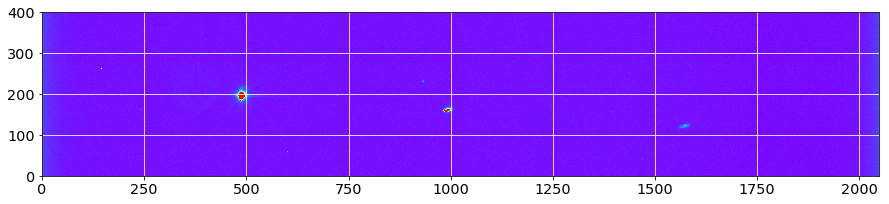

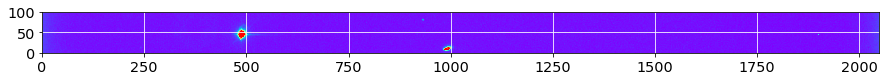

In [17]:
sel=0
image_sel=np.copy(all_images[sel])
y0=DeltaY[sel]
x0=x_guess[sel]

width_cut = 50
right_edge = IMSIZE

plt.imshow(image_sel,origin='lower',cmap='rainbow',vmin=-10,vmax=800)
plt.grid(color='white', ls='solid')
plt.show()

region=np.copy(image_sel[y0-width_cut:y0+width_cut,0:right_edge])
data=np.copy(region)
plt.imshow(data,origin='lower',cmap='rainbow',vmin=-10,vmax=800)
plt.grid(color='white', ls='solid')
plt.show()

In [18]:
# le paramètre sigma permet de lisser le hessien
Hxx, Hxy, Hyy = hessian_matrix(data, sigma=3, order = 'xy')
lambda_plus = 0.5*( (Hxx+Hyy) + np.sqrt( (Hxx-Hyy)**2 +4*Hxy*Hxy) )
lambda_minus = 0.5*( (Hxx+Hyy) - np.sqrt( (Hxx-Hyy)**2 +4*Hxy*Hxy) )
theta = 0.5*np.arctan2(2*Hxy,Hyy-Hxx)*180/np.pi

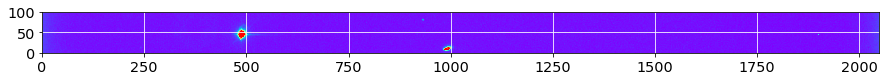

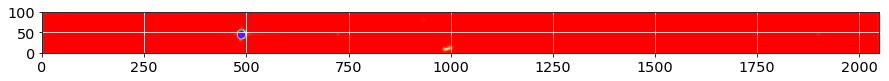

In [19]:
plt.imshow(data,origin='lower',cmap='rainbow',vmin=-10,vmax=800)
plt.grid(color='white', ls='solid')
plt.show()
plt.imshow(lambda_minus,origin='lower',cmap='rainbow',vmin=-100,vmax=0)
plt.grid(color='white', ls='solid')
plt.show()

Number of remaining pixels : 768


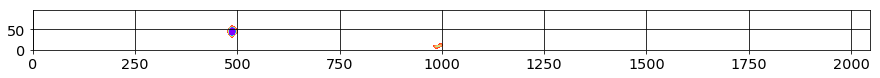

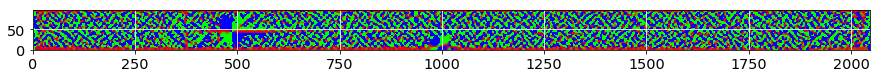

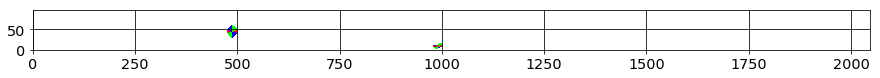

In [20]:
lambda_threshold = -7
margin_cut = 1

lambda_minus = lambda_minus[margin_cut:-margin_cut,margin_cut:-margin_cut]
lambda_plus = lambda_plus[margin_cut:-margin_cut,margin_cut:-margin_cut]
theta = theta[margin_cut:-margin_cut,margin_cut:-margin_cut]

mask = np.where(lambda_minus>lambda_threshold)
lambda_mask = np.copy(lambda_minus)
lambda_mask[mask]=np.nan

theta_mask = np.copy(theta)
theta_mask[mask]=np.nan

print 'Number of remaining pixels :',len(lambda_mask[~np.isnan(lambda_mask)])

plt.imshow(lambda_mask,origin='lower',cmap='rainbow',vmin=-100,vmax=0)
plt.grid(color='black', ls='solid')
plt.show()

plt.imshow(theta,origin='lower',cmap=cm.brg,vmin=-30,vmax=30)
plt.grid(color='white', ls='solid')
plt.show()

plt.imshow(theta_mask,origin='lower',cmap=cm.brg,vmin=-30,vmax=30)
plt.grid(color='black', ls='solid')
plt.show()

Number of remaining pixels : 217


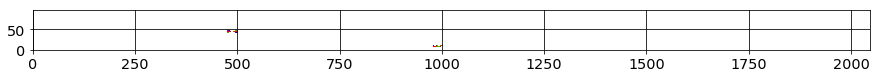

In [21]:
deg_threshold = 20

mask2 = np.where(np.abs(theta)>deg_threshold)
theta_mask[mask2] = np.nan
print 'Number of remaining pixels :',len(theta_mask[~np.isnan(theta_mask)])
plt.imshow(theta_mask,origin='lower',cmap=cm.brg,vmin=-deg_threshold,vmax=deg_threshold)
plt.grid(color='black', ls='solid')
plt.show()

Angle median : 3.27520537305


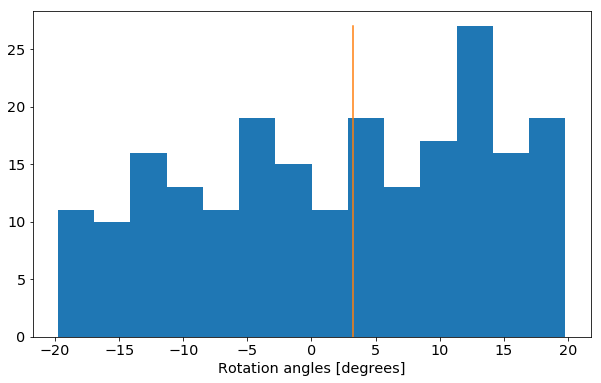

In [22]:
theta_hist = []
theta_hist = theta_mask[~np.isnan(theta_mask)].flatten()
theta_median = np.median(theta_hist)
print 'Angle median :',theta_median
fig = plt.figure(figsize=(10,6))
n,bins, patches = plt.hist(theta_hist,bins=int(np.sqrt(len(theta_hist))))
plt.plot([theta_median,theta_median],[0,np.max(n)])
plt.xlabel("Rotation angles [degrees]")
plt.show()

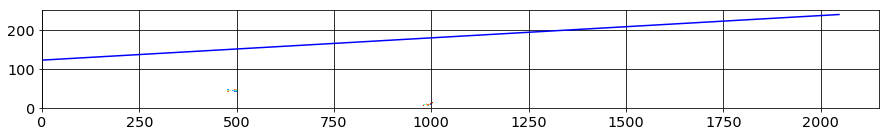

In [23]:
xindex=np.arange(data.shape[1])
x_new = np.linspace(xindex.min(),xindex.max(), 50)
y_new = y0 - width_cut + (x_new-x0)*np.tan(theta_median*np.pi/180.)
plt.imshow(theta_mask,origin='lower',cmap='rainbow',vmin=-deg_threshold,vmax=deg_threshold)
plt.plot(x_new,y_new,'b-')
plt.grid(color='black', ls='solid')
plt.show()

On peut aussi essayer de fitter le spectre qui a été détecté par la méthode ci-dessus.

Rotation angle from fit : -3.98261962553


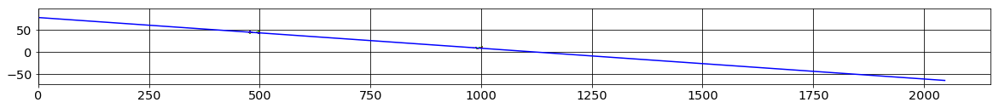

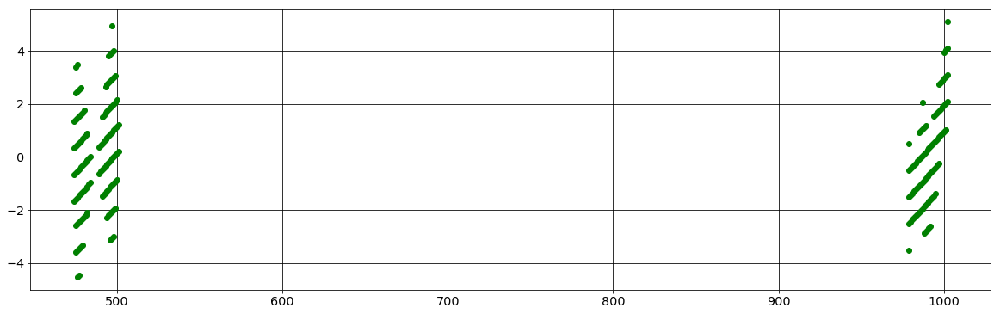

In [24]:
xtofit=[]
ytofit=[]
for iy,y in enumerate(theta_mask):
    for ix,x in enumerate(y):
        if not np.isnan(theta_mask[iy][ix]) :
            if np.abs(theta_mask[iy][ix])>deg_threshold : continue
            xtofit.append(ix)
            ytofit.append(iy)
popt, pcov = fit_line(xtofit, ytofit)
[a, b] = popt
x_new = np.linspace(xindex.min(),xindex.max(), 50)
y_new = line(x_new,a,b)
print 'Rotation angle from fit :',np.arctan(a)*180/np.pi
fig = plt.figure(figsize=[20,6])
plt.imshow(theta_mask,origin='lower',cmap=cm.brg,vmin=-deg_threshold,vmax=deg_threshold)
plt.plot(x_new,y_new,'b-')
plt.grid(color='black', ls='solid')
plt.show()
fig = plt.figure(figsize=[20,6])
diff = []
for ix,x in enumerate(xtofit):
    diff.append(ytofit[ix]-line(x,a,b))
plt.plot(xtofit,diff,'go')
plt.grid(color='black', ls='solid')
plt.show()

0  theta =  -3.98261962553
1  theta =  -3.31627540273
2  theta =  -2.82944828307
3  theta =  -2.44648125288
4  theta =  -2.00636264201
5  theta =  -3.10948062835
6  theta =  -2.67164327562
7  theta =  -2.42066963487
8  theta =  -2.18095074483
9  theta =  -1.96723653885
10  theta =  -2.09215341831
11  theta =  -1.98278537119
12  theta =  -1.93751837721
13  theta =  -1.92078906938
14  theta =  -1.90673434008
15  theta =  -1.16031326583
16  theta =  -1.26332306599
17  theta =  -1.4184797891
18  theta =  -1.61929027309
19  theta =  -1.82743070994
20  theta =  -0.183773411336
21  theta =  -0.526758794877
22  theta =  -0.897909229639
23  theta =  -1.30621543478
24  theta =  -1.73232187372


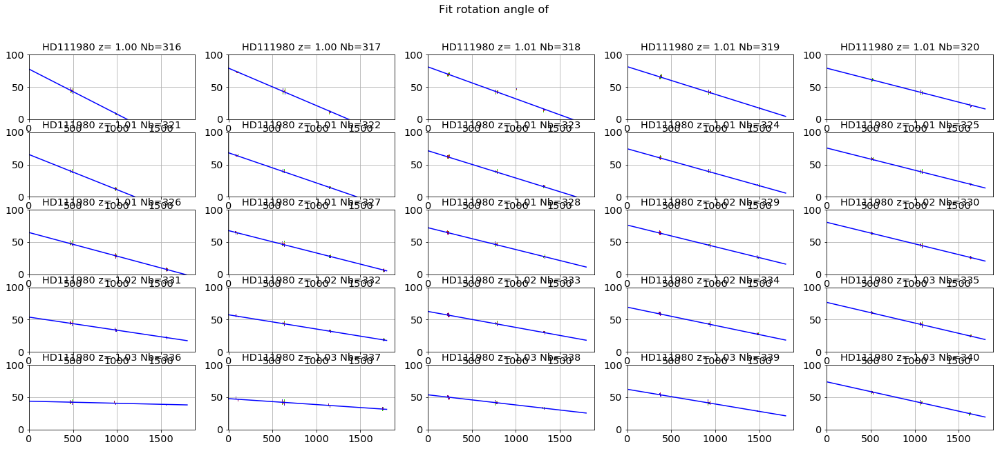

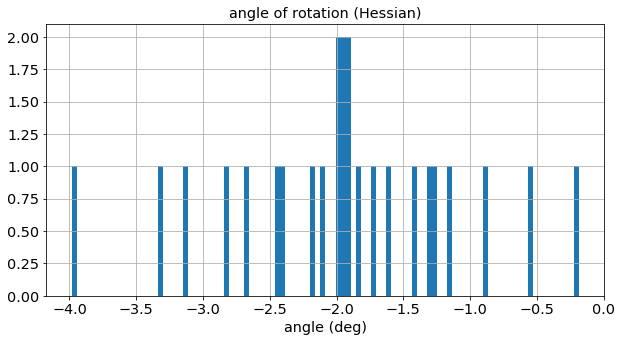

In [26]:
all_theta=ComputeRotationAngleHessianAndFit(all_images,x_guess,DeltaY,all_titles,object_name, 
   NBIMGPERROW=5, lambda_threshold = -7, deg_threshold = 20, width_cut = 50, right_edge = 1800, margin_cut=1)
figfilename=os.path.join(dir_top_images,'fit_rotation.pdf')
plt.savefig(figfilename)  

for index in range(len(all_theta)):
    print index,' theta = ',all_theta[index]
plt.figure(figsize=(10,5))
n, bins, patches=plt.hist(all_theta,bins=100,histtype='stepfilled')
plt.grid(True)
plt.title('angle of rotation (Hessian)')
plt.xlabel('angle (deg)')

### Turn the images accordingly

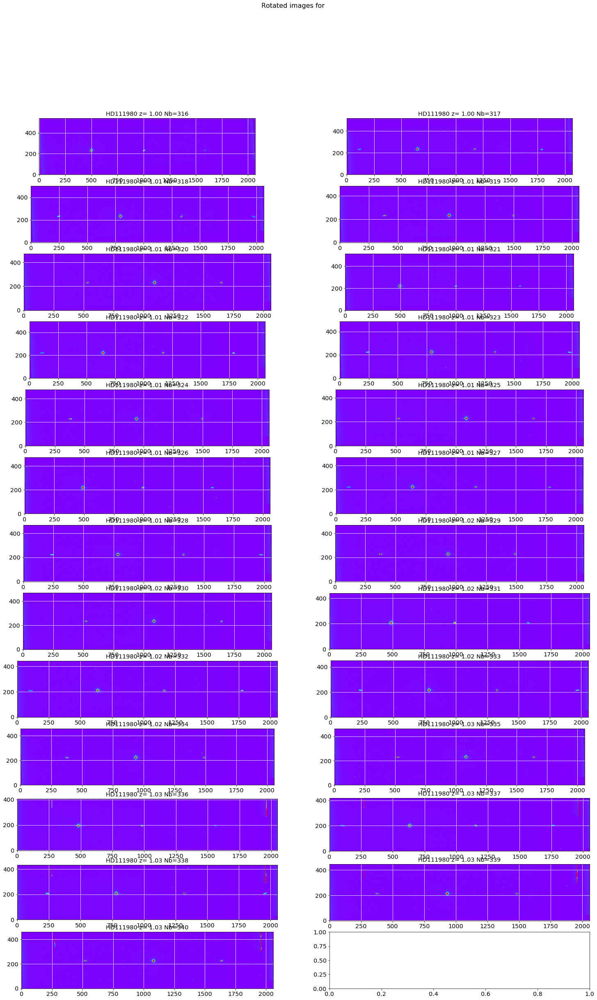

In [27]:
turned_images=TurnTheImages(all_images,all_theta,all_titles,object_name,NBIMGPERROW=2,
                            oversample_factor=1) 
figfilename=os.path.join(dir_top_images,'rotated_images.pdf')
plt.savefig(figfilename)  

### Check rotation

In case of bad rotation, check by eye

array([ -1.67023510e-02,  -2.92648871e-02,  -2.66781206e-02,
         1.19408028e-02,  -3.35719563e-03,   7.07940328e-02,
        -3.71557343e-02,   3.71891288e-03,   1.39588409e-01,
        -1.82518856e-03,   5.25033938e-05,  -6.15848868e-03,
         1.81110126e-02,   3.21926150e-03,   5.31637877e-04,
         5.99127890e-03,   1.04373245e-03,   8.95942785e-05,
         4.61621219e-03,   4.57348740e-04,   1.94245531e-02,
        -6.05943060e-05,  -4.03488056e-05,  -3.73345509e-03,
        -5.11407268e-04])

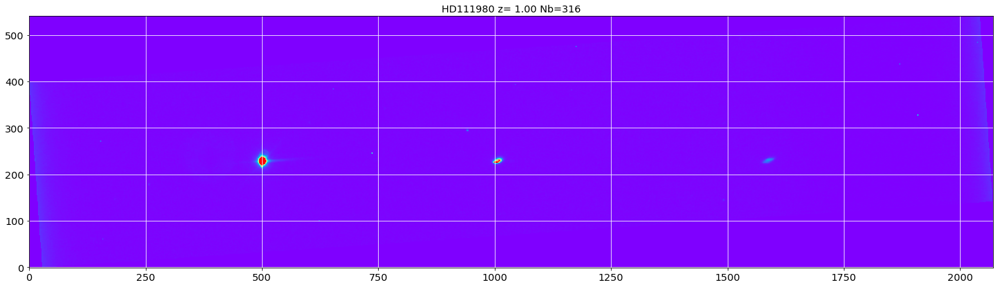

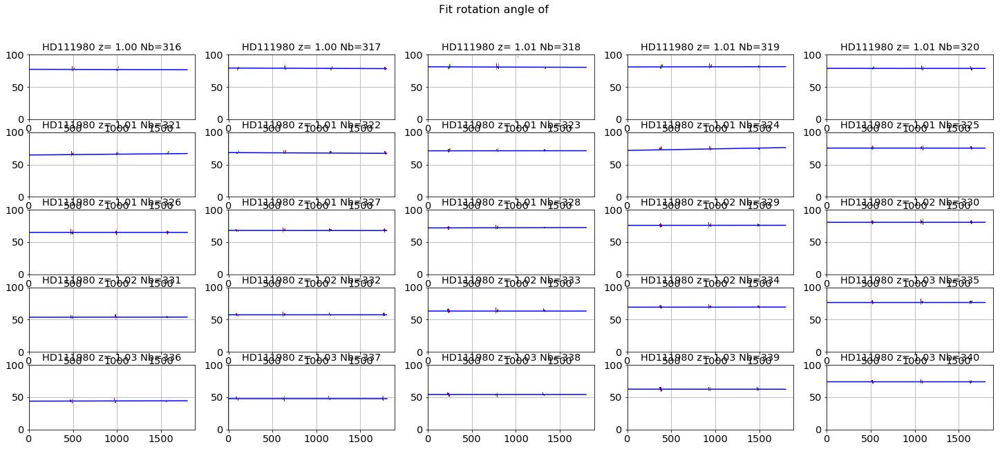

In [29]:
sel=0
plt.figure(figsize=(25,10))
plt.imshow(turned_images[sel],origin='lower',cmap='rainbow',vmin=0,vmax=1000)
plt.grid(True)
plt.title(all_titles[sel])
plt.grid(color='white', ls='solid')
figfilename=os.path.join(dir_top_images,'rotated_image_sample.pdf')
plt.savefig(figfilename)  

ComputeRotationAngleHessianAndFit(turned_images,x_guess,DeltaY,all_titles,object_name, 
            NBIMGPERROW=5, lambda_threshold = -7, deg_threshold = 20, width_cut = 50, right_edge = 1800)

Cut the extra spectra that pollute the images.

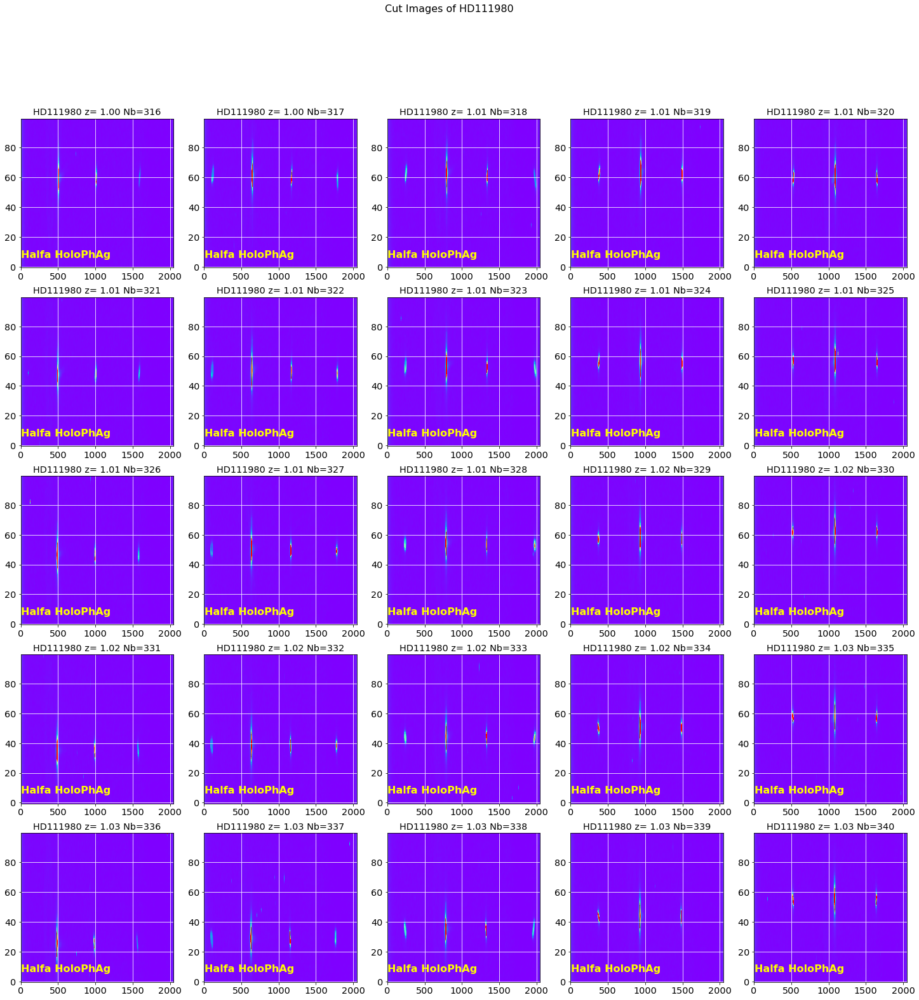

In [30]:
DeltaY_rot2 = [50]*len(all_images)
y_guess_rot2 = [220]*len(all_images)
images_cut_rot=ShowCenterImages(x_guess,y_guess_rot2,DeltaX,DeltaY_rot2,
                    turned_images,all_titles,all_filt,object_name,NBIMGPERROW=5,vmin=0,vmax=1000) 

# Find the central star locations
======================================

### Central star positions after rotation

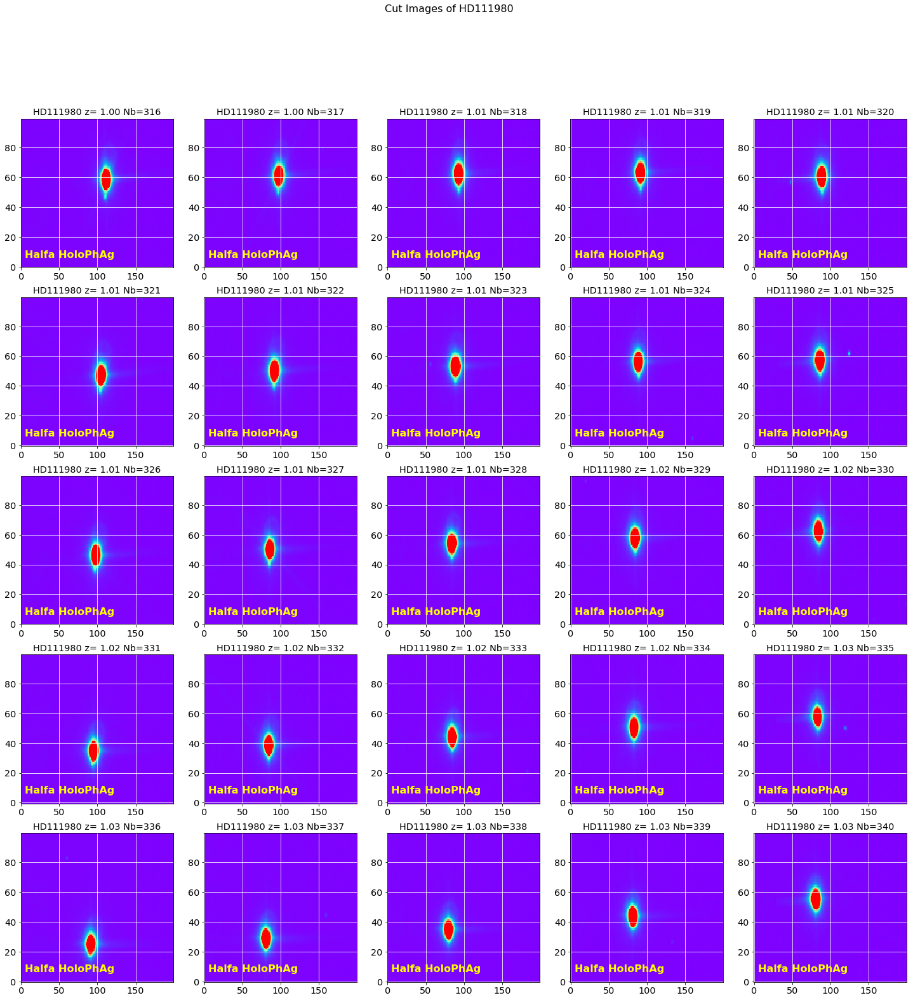

In [31]:
x_guess_rot = x_guess
y_guess_rot = DeltaY_rot2
DeltaY_rot = [50]*len(all_images)
DeltaX_rot = [100]*len(all_images)

images_cut=ShowCenterImages(x_guess_rot,y_guess_rot,DeltaX_rot,DeltaY_rot,
                    images_cut_rot,all_titles,all_filt,object_name,NBIMGPERROW=5,vmin=0,vmax=2000) 

In [32]:
# (JN) valeurs optimisées pour cette étude
img_mean,img_median,img_std,img_sources=ComputeStatImages(images_cut,fwhm=5,threshold=200,sigma=10.0,iters=5)

----------------------------------------------------------------
0  mean, median, std =  21.0041188955 12.1505318525 43.1519539186
 id   xcentroid     ycentroid   ...      peak          flux          mag      
--- ------------- ------------- ... ------------- ------------- --------------
  1 110.525489831 57.7621573673 ... 60199.9269358 8.74138816216 -2.35395101388
----------------------------------------------------------------
1  mean, median, std =  21.6096031324 12.6274242455 43.5460528427
 id   xcentroid     ycentroid   ...      peak          flux          mag      
--- ------------- ------------- ... ------------- ------------- --------------
  1 97.2747283268 60.3650234449 ... 60519.5408208 9.28795694572 -2.41980048391
----------------------------------------------------------------
2  mean, median, std =  20.5058153791 11.1186129956 45.9030009858
 id   xcentroid     ycentroid   ...      peak          flux          mag     
--- ------------- ------------- ... ------------- -----

        Use DAOStarFinder instead. [astropy.utils.decorators]


----------------------------------------------------------------
4  mean, median, std =  20.1384392602 10.8808929387 45.693162341
 id   xcentroid     ycentroid   ...      peak          flux          mag      
--- ------------- ------------- ... ------------- ------------- --------------
  1 88.4567666645 59.6534797248 ... 61276.3690202 8.62227205372 -2.33905430446
----------------------------------------------------------------
5  mean, median, std =  21.9705155649 13.3205177593 42.3663276174
 id   xcentroid     ycentroid   ...      peak          flux          mag      
--- ------------- ------------- ... ------------- ------------- --------------
  1 103.792103551 46.3482640291 ... 60439.7911441 9.23865527101 -2.41402190563
----------------------------------------------------------------
6  mean, median, std =  20.744898798 11.7604448447 43.8174836962
 id   xcentroid     ycentroid   ...     peak          flux          mag      
--- ------------- ------------- ... ------------ --------

### Central star position

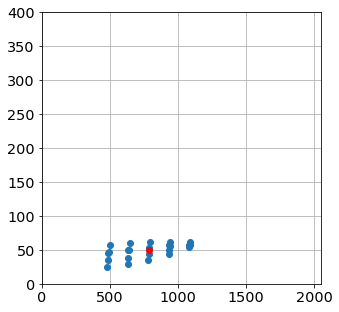

In [33]:
x_star = []
y_star = []
for index,s in enumerate(img_sources):
    thestar = None
    test = -1
    for ss in s:
        x_star.append(ss['xcentroid']+x_guess_rot[index]-DeltaX_rot[index])
        y_star.append(ss['ycentroid']+y_guess_rot[index]-DeltaY_rot[index])
        
x_mean = np.mean(x_star)
y_mean = np.mean(y_star)
img_size=all_images[0].shape
plt.figure(figsize=(5,5))
plt.plot(x_star,y_star,'o')
plt.plot(x_mean,y_mean,'ro')
plt.xlim(0,img_size[1])
plt.ylim(0,img_size[0])
plt.grid(True)

## Pointing positions before rotations

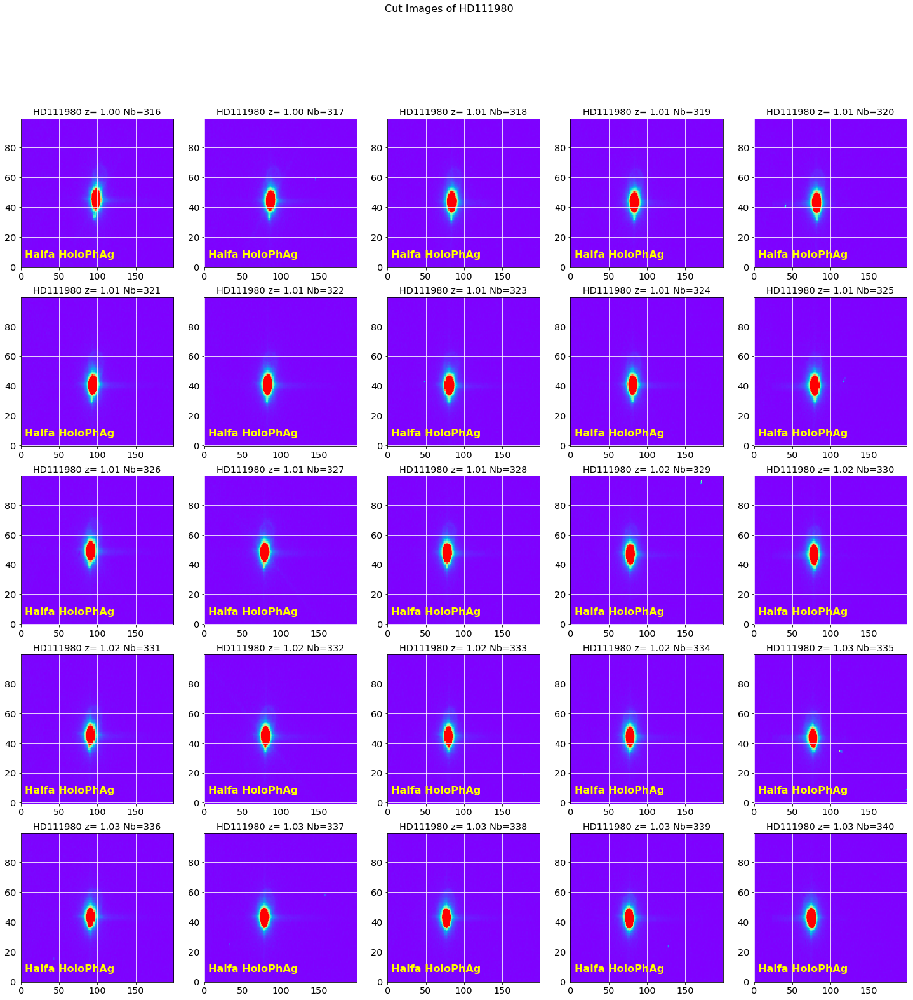

In [34]:
DeltaY_rot = [50]*len(all_images)
DeltaX_rot = [100]*len(all_images)
images_raw_cut=ShowCenterImages(x_guess,DeltaY,DeltaX_rot,DeltaY_rot,
                    images_raw,all_titles,all_filt,object_name,NBIMGPERROW=5,vmin=0,vmax=2000) 

In [35]:
# (JN) valeurs optimisées pour cette étude
img_mean,img_median,img_std,img_sources=ComputeStatImages(images_raw_cut,fwhm=5,threshold=200,sigma=10.0,iters=5)

----------------------------------------------------------------
0  mean, median, std =  21.2222615735 13.0 45.2270784105
 id   xcentroid     ycentroid   ...   peak       flux          mag     
--- ------------- ------------- ... ------- ------------- -------------
  1 97.4035130291 44.4953632002 ... 60698.0 9.74128281952 -2.4715403811
----------------------------------------------------------------
1  mean, median, std =  21.4713801306 13.0 44.5161648155
 id   xcentroid     ycentroid   ...   peak       flux          mag      
--- ------------- ------------- ... ------- ------------- --------------
  1 86.3164211316 43.7203316021 ... 60699.0 10.7100727875 -2.57448105596
----------------------------------------------------------------
2  mean, median, std =  20.3236291833 12.0 45.8580530875
 id   xcentroid     ycentroid   ...   peak       flux          mag      
--- ------------- ------------- ... ------- ------------- --------------
  1 83.5977747311 42.7705699325 ... 60700.0 10.255488

[[  487.40351303   294.4953632 ]
 [  636.31642113   293.7203316 ]
 [  783.59777473   292.77056993]
 [  933.31308313   292.46749649]
 [ 1081.71812726   292.11623255]
 [  482.98445305   440.13775135]
 [  632.62444772   439.97604029]
 [  780.25060456   439.57621493]
 [  931.02098162   439.95571736]
 [ 1079.20509378   439.4810776 ]
 [  480.13287348   588.19506989]
 [  628.62905326   587.38608442]
 [  777.45689111   587.04202255]
 [  927.92416877   586.03288319]
 [ 1078.22751026   585.60278754]
 [  479.85476344   735.0112071 ]
 [  630.10353375   734.64183496]
 [  779.49754049   734.5214422 ]
 [  927.70003087   734.05028637]
 [ 1076.94447223   733.39330769]
 [  480.07869349   883.10434839]
 [  628.51699763   882.78590117]
 [  776.44036941   882.59080207]
 [  926.550817     882.059828  ]
 [ 1075.10610667   882.2413559 ]]
[500.52548983082272, 647.2747283268011, 792.74360715649436, 941.20899553441654, 1088.4567666645105, 493.79210355130226, 641.52170634452898, 788.42453355882833, 938.4666341997

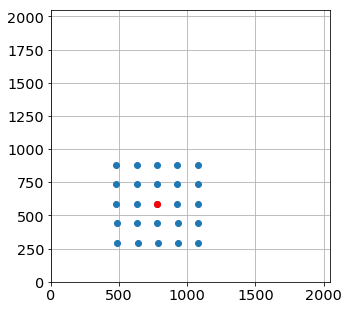

In [158]:
x_pointing = []
y_pointing = []
for index,s in enumerate(img_sources):
    for ss in s:
        x_pointing.append(ss['xcentroid']+x_guess[index]-DeltaX_rot[index])
        y_pointing.append(ss['ycentroid']+y_guess[index]-DeltaY_rot[index])
        
x_mean = np.mean(x_pointing)
y_mean = np.mean(y_pointing)
img_size=all_images[0].shape
order0_positions = np.array([x_pointing,y_pointing]).T
print order0_positions
print x_star
plt.figure(figsize=(5,5))
plt.plot(order0_positions.T[0],order0_positions.T[1],'o')
plt.plot(x_mean,y_mean,'ro')
plt.xlim(0,IMSIZE)
plt.ylim(0,IMSIZE)
plt.grid(True)

## Save results

In [159]:
newfullfilenames=[]
for idx,f in np.ndenumerate(sorted_files):
    short_infilename=f.split("/")[-1]
    short_partfilename=re.findall('^cutimg_(.*)',short_infilename)
    short_outfilename='rotimg_'+short_partfilename[0]
    newfullfilename=os.path.join(outputdir,short_outfilename)
    newfullfilenames.append(newfullfilename)

for idx,f in np.ndenumerate(newfullfilenames):
    prihdu = fits.PrimaryHDU(header=all_header[idx[0]],data=images_cut_rot[idx[0]])
    thdulist = fits.HDUList(prihdu)
    thdulist.writeto(f,overwrite=True)
textfilename=os.path.join(outputdir,'star_centroids.txt')
print textfilename
np.savetxt(textfilename,order0_positions,header="y_star x_star",fmt='%d')

!ls -l rotated_fitsimages

IndexError: list index out of range

# Extract spectra
===================================

In [39]:
outputdir="./spectrum_fitsspec"
ensure_dir(outputdir)

inputdir="./rotated_fitsimages"
SelectTagRe='^rotimg_%s_([0-9]+).fits$' % date # regular expression to select the file
SearchTagRe='^rotimg_%s_[0-9]+.fits$' % date

In [40]:
sorted_numbers,sorted_files = MakeFileList([inputdir],MIN_IMGNUMBER,MAX_IMGNUMBER,SelectTagRe,SearchTagRe) 

all_dates,all_airmass,all_images,all_titles,all_header,all_expo,all_filt=BuildImages(sorted_files,sorted_numbers,object_name)

print 'Number of images:',len(all_images)

Number of images: 25


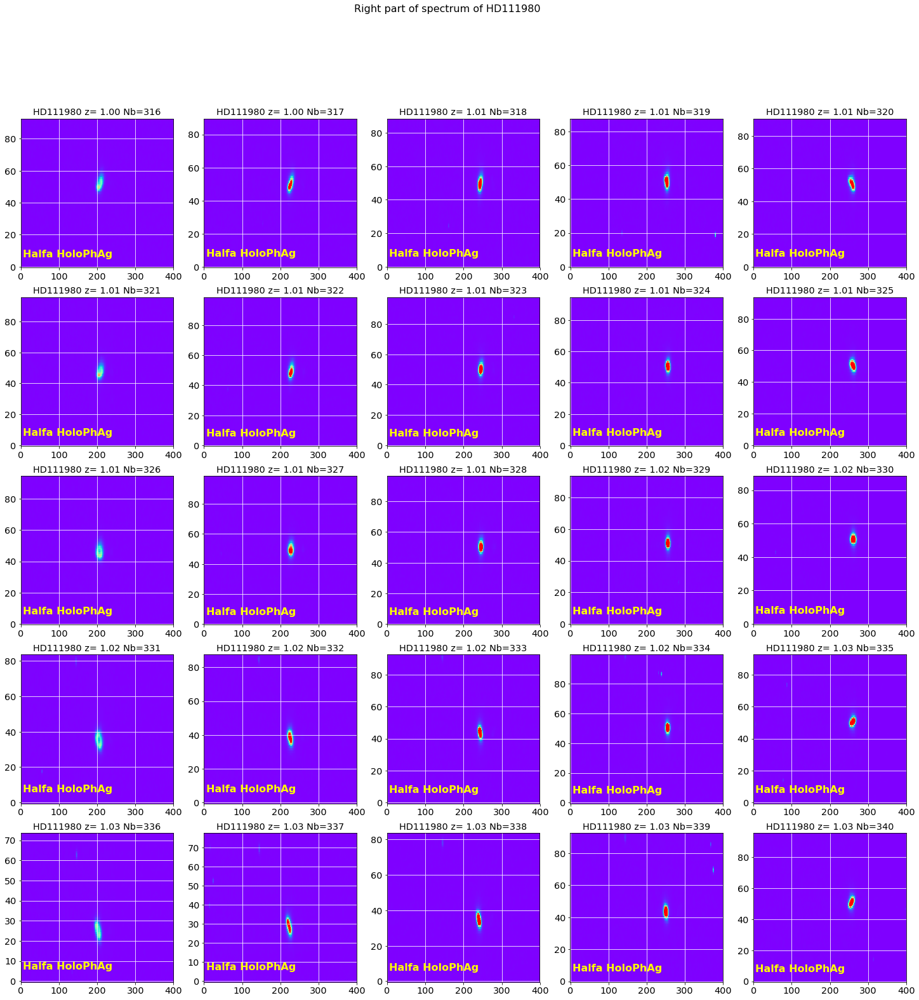

In [41]:
# Right spectrum
x_guess_right = []
for x in x_star :
    x_guess_right.append(min(IMSIZE-1,x+500))
ShowCenterImages(x_guess_right,y_star,[200]*len(all_images),[50]*len(all_images),
                 all_images,all_titles,all_filt,object_name,NBIMGPERROW=5,vmin=0,vmax=2000)
title='Right part of spectrum of {} '.format(object_name)
plt.suptitle(title,size=16)
figfilename=os.path.join(dir_top_images,'rightorder.pdf')
plt.savefig(figfilename)  

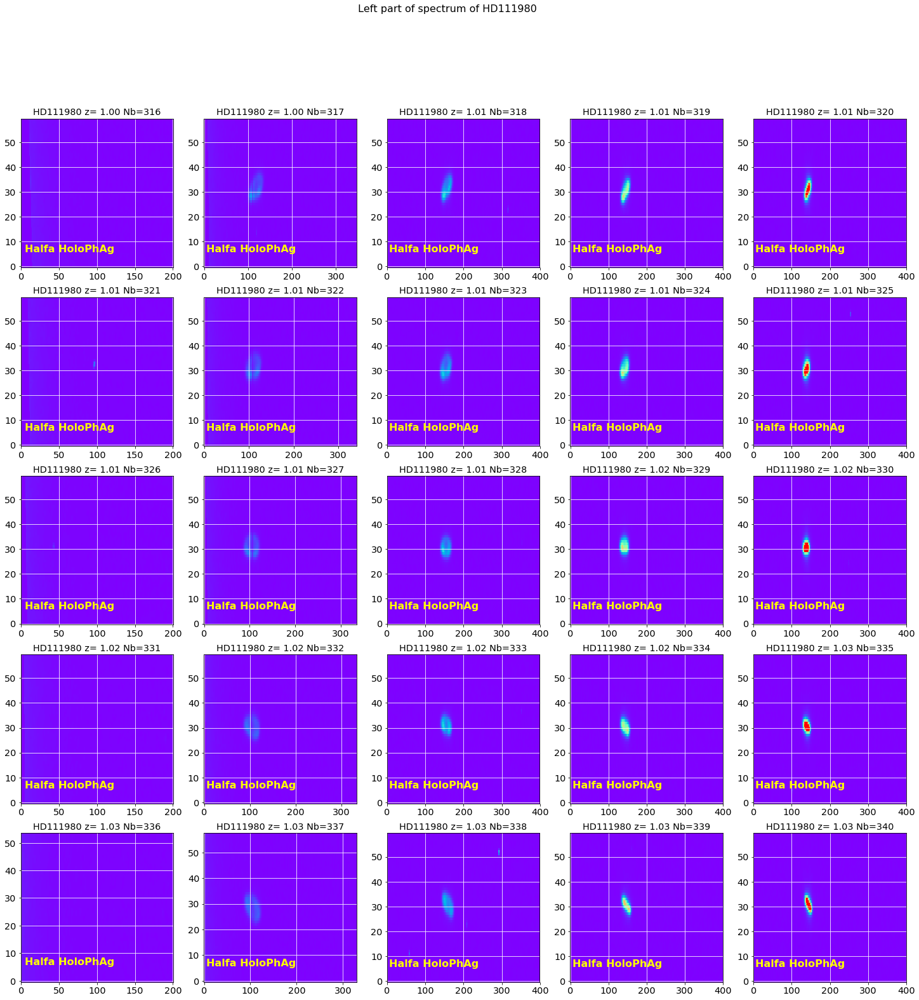

In [42]:
# Left spectrum
x_guess_left = []
for x in x_star :
    x_guess_left.append(max(1,x-500))
ShowCenterImages(x_guess_left,y_star,[200]*len(all_images),[30]*len(all_images),
                 all_images,all_titles,all_filt,object_name,NBIMGPERROW=5,vmin=0,vmax=2000)
title='Left part of spectrum of {} '.format(object_name)
plt.suptitle(title,size=16)
figfilename=os.path.join(dir_top_images,'leftorder.pdf')
plt.savefig(figfilename)  

### Extraction

[58,
 60,
 61,
 62,
 60,
 46,
 49,
 52,
 55,
 56,
 45,
 49,
 53,
 57,
 61,
 35,
 39,
 44,
 50,
 58,
 25,
 29,
 35,
 43,
 55]

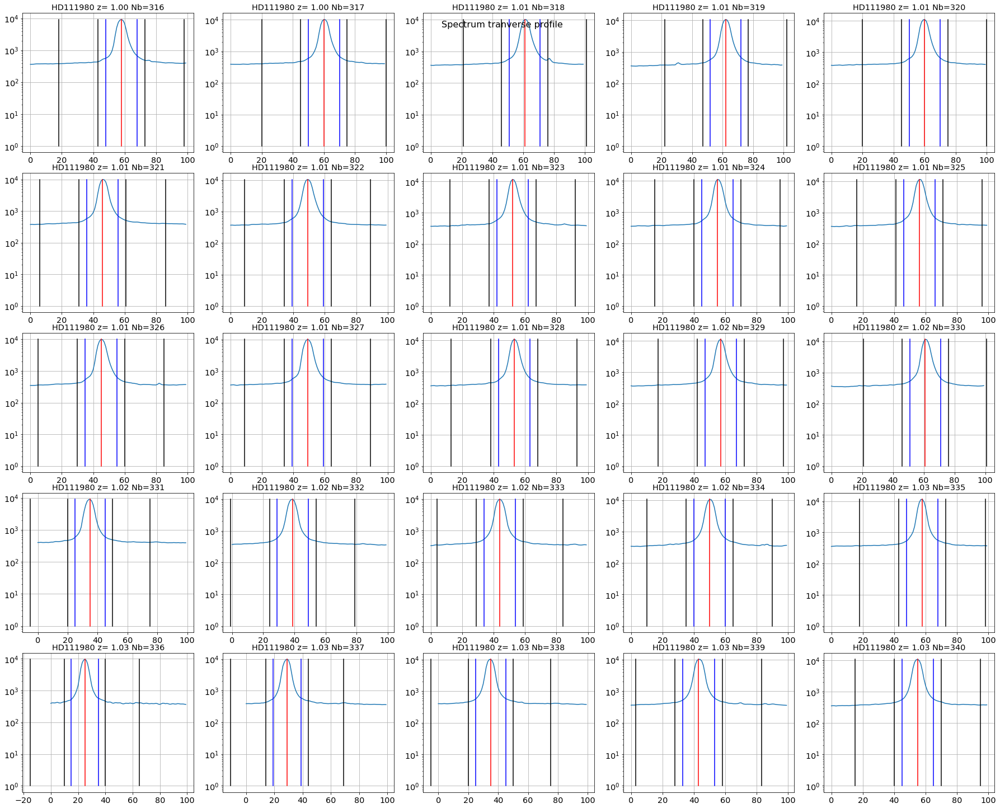

In [43]:
ShowTransverseProfile(all_images,all_titles,object_name,all_expo,NBIMGPERROW=5,DeltaX=1000,w=10,ws=[15,40],right_edge=1800)

In [44]:
thespectra,thespectraUp,thespectraDown=ExtractSpectra(y_star,all_images,all_titles,object_name,all_expo,
                                                      w=10,ws=[15,40],right_edge=IMSIZE)

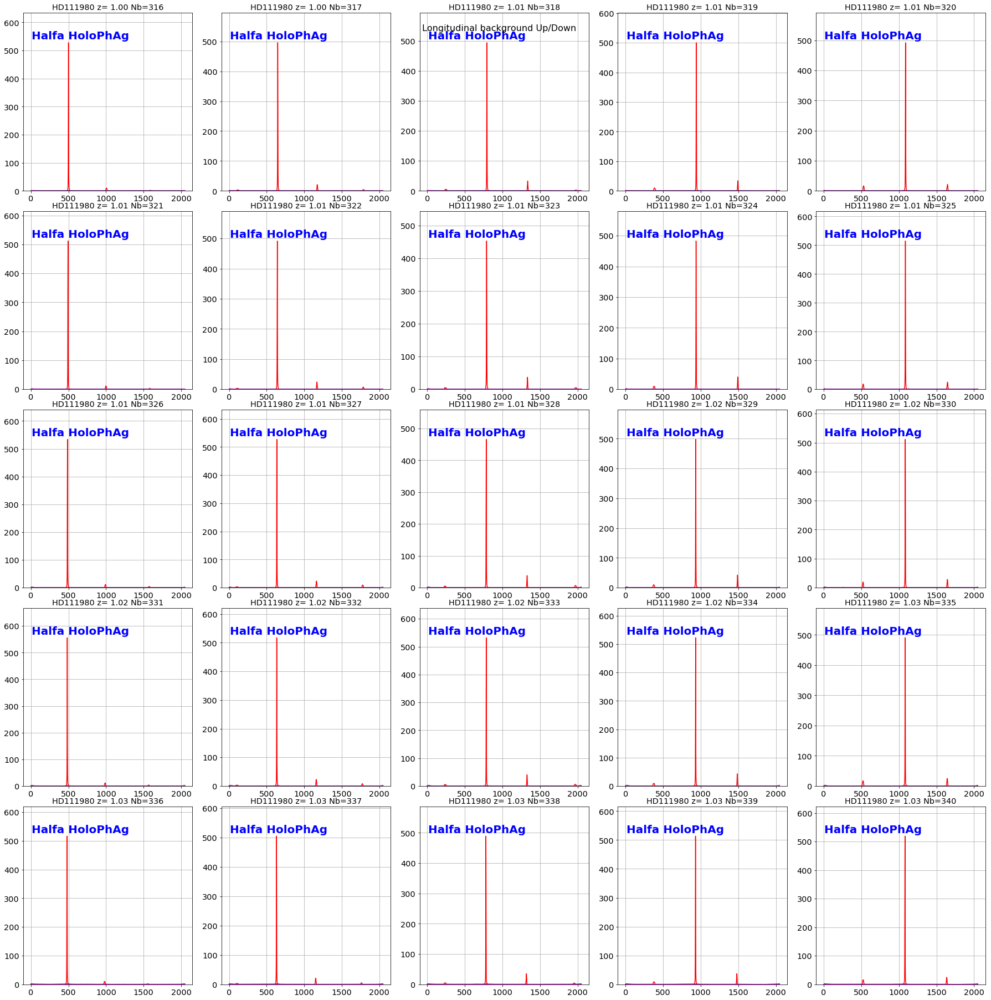

In [45]:
Clean_Up, Clean_Do,Clean_Av=CleanBadPixels(thespectraUp,thespectraDown) 

ShowLongitBackground(thespectra,Clean_Up,Clean_Do,Clean_Av,all_titles,all_filt,object_name,
                     NBIMGPERROW=5,right_edge=IMSIZE)
figfilename=os.path.join(dir_top_images,'background_longprofile.pdf')
plt.savefig(figfilename)   

(0, 800.0)

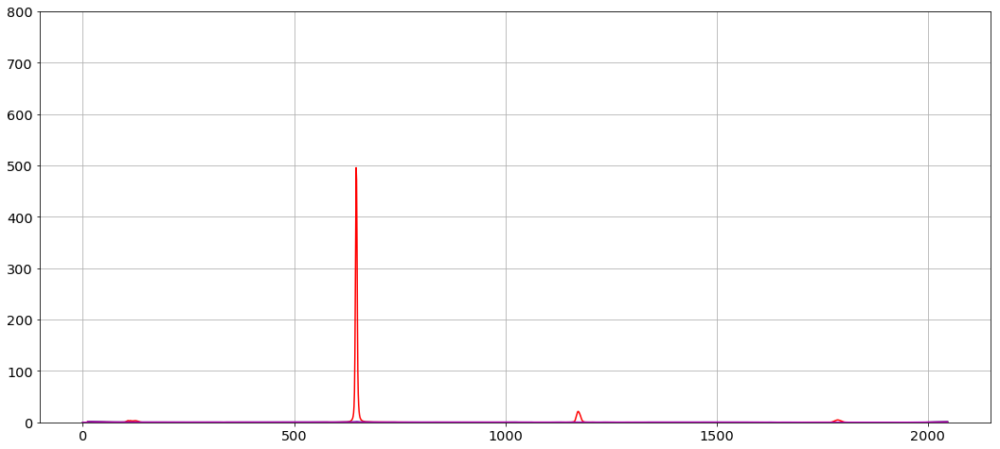

In [46]:
sel=1
plt.figure(figsize=(18,8))
plt.plot(thespectra[sel],'r-') 
plt.plot(Clean_Up[sel],'b-') 
plt.plot(Clean_Do[sel],'g-')
plt.plot(Clean_Av[sel],'m-')
plt.grid(True)
plt.ylim(0,800.)

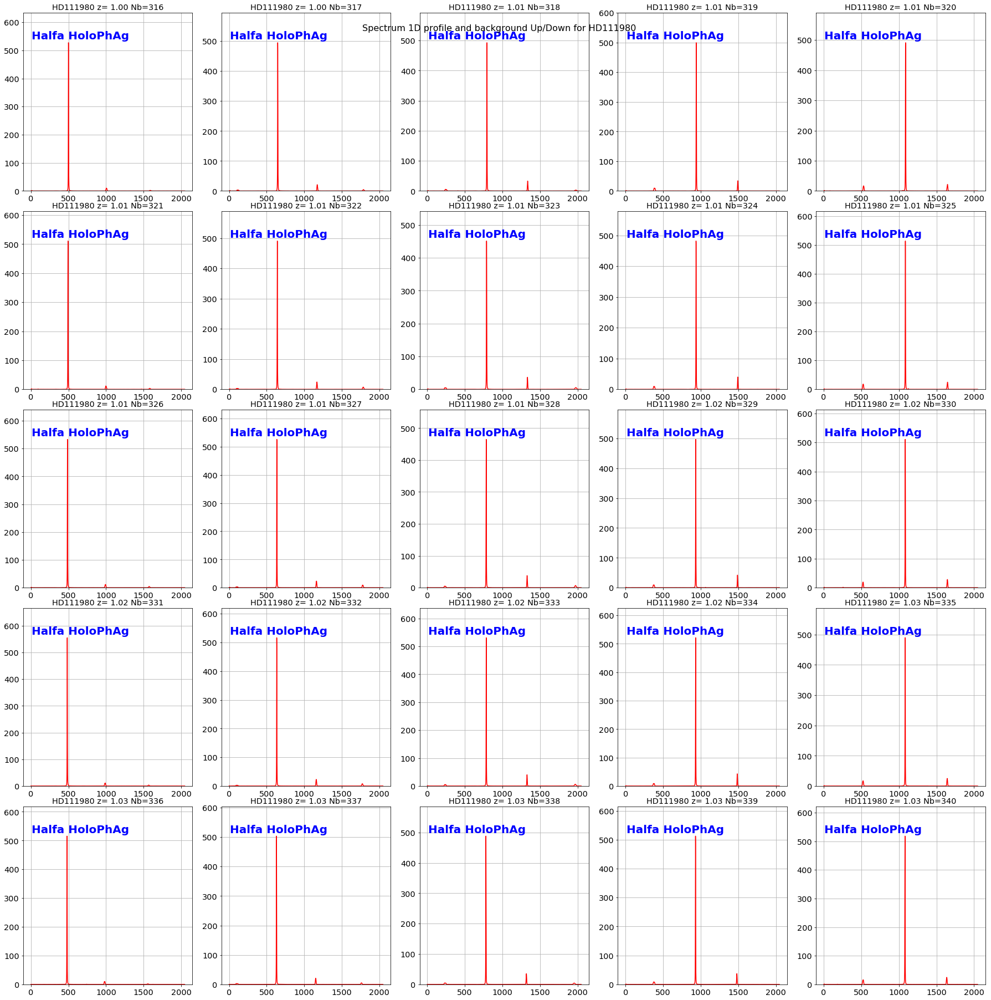

In [47]:
thecorrspectra=CorrectSpectrumFromBackground(thespectra,Clean_Av)

ShowSpectrumProfile(thecorrspectra,all_titles,object_name,all_filt,NBIMGPERROW=5)
figfilename=os.path.join(dir_top_images,'correctedspectrum_profile.pdf')
plt.savefig(figfilename) 

# Grating characterisation

Halfa HoloPhAg:	 gaussian center x=500.54+/-0.03
Halfa HoloPhAg:	 gaussian center x=647.32+/-0.02
Halfa HoloPhAg:	 gaussian center x=792.74+/-0.03
Halfa HoloPhAg:	 gaussian center x=941.24+/-0.02
Halfa HoloPhAg:	 gaussian center x=1088.48+/-0.02
Halfa HoloPhAg:	 gaussian center x=493.84+/-0.03
Halfa HoloPhAg:	 gaussian center x=641.55+/-0.02
Halfa HoloPhAg:	 gaussian center x=788.47+/-0.03
Halfa HoloPhAg:	 gaussian center x=938.47+/-0.02
Halfa HoloPhAg:	 gaussian center x=1086.02+/-0.02
Halfa HoloPhAg:	 gaussian center x=487.06+/-0.02
Halfa HoloPhAg:	 gaussian center x=635.47+/-0.02
Halfa HoloPhAg:	 gaussian center x=783.69+/-0.02
Halfa HoloPhAg:	 gaussian center x=934.15+/-0.02
Halfa HoloPhAg:	 gaussian center x=1084.30+/-0.02
Halfa HoloPhAg:	 gaussian center x=484.10+/-0.03
Halfa HoloPhAg:	 gaussian center x=634.32+/-0.03
Halfa HoloPhAg:	 gaussian center x=784.16+/-0.03
Halfa HoloPhAg:	 gaussian center x=932.91+/-0.02
Halfa HoloPhAg:	 gaussian center x=1083.11+/-0.02
Halfa HoloPhAg:	

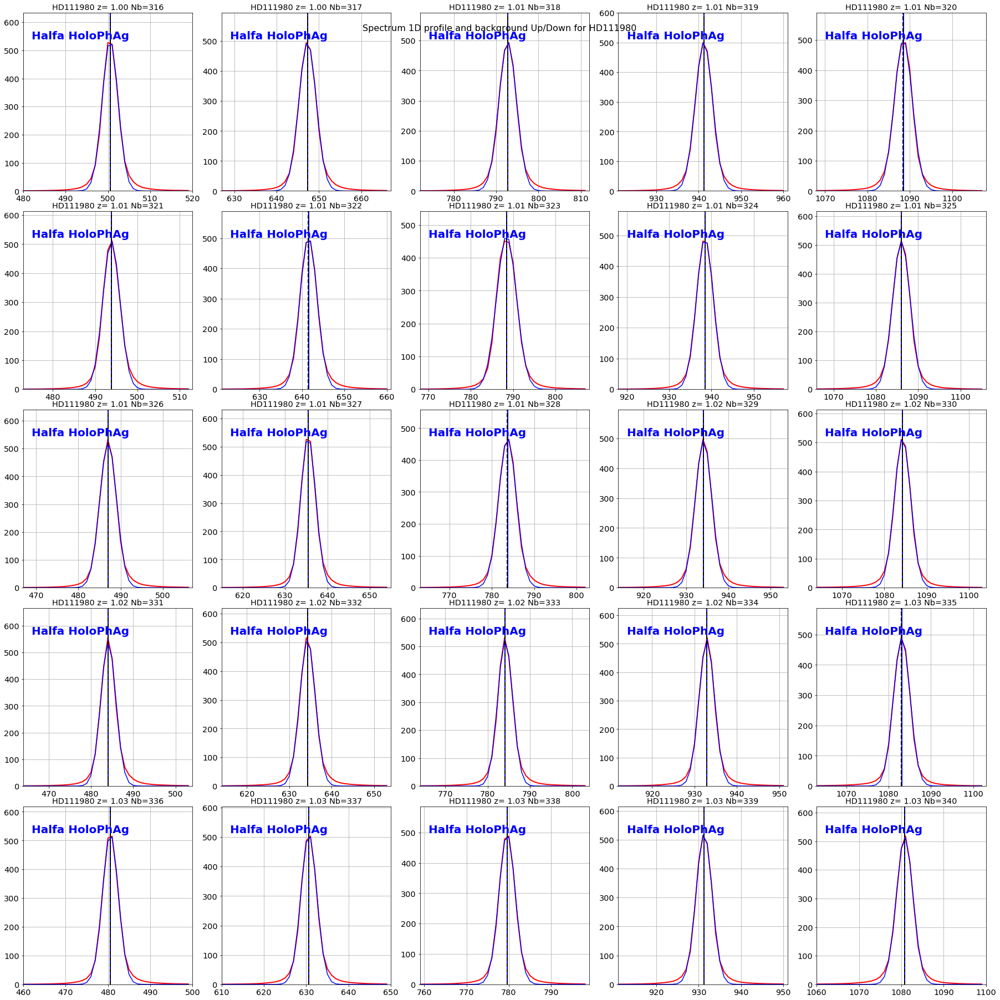

In [48]:
# Zero order profile
xlims_zero = []
for x in x_star :
    xlims_zero.append([x-20,x+20])
ShowSpectrumProfileFit(thecorrspectra,all_titles,object_name,all_filt,NBIMGPERROW=5,
                       xlim=xlims_zero,guess=[10,800,100],vertical_lines=x_star)
print 'CCDPROC star centers:'
print x_star

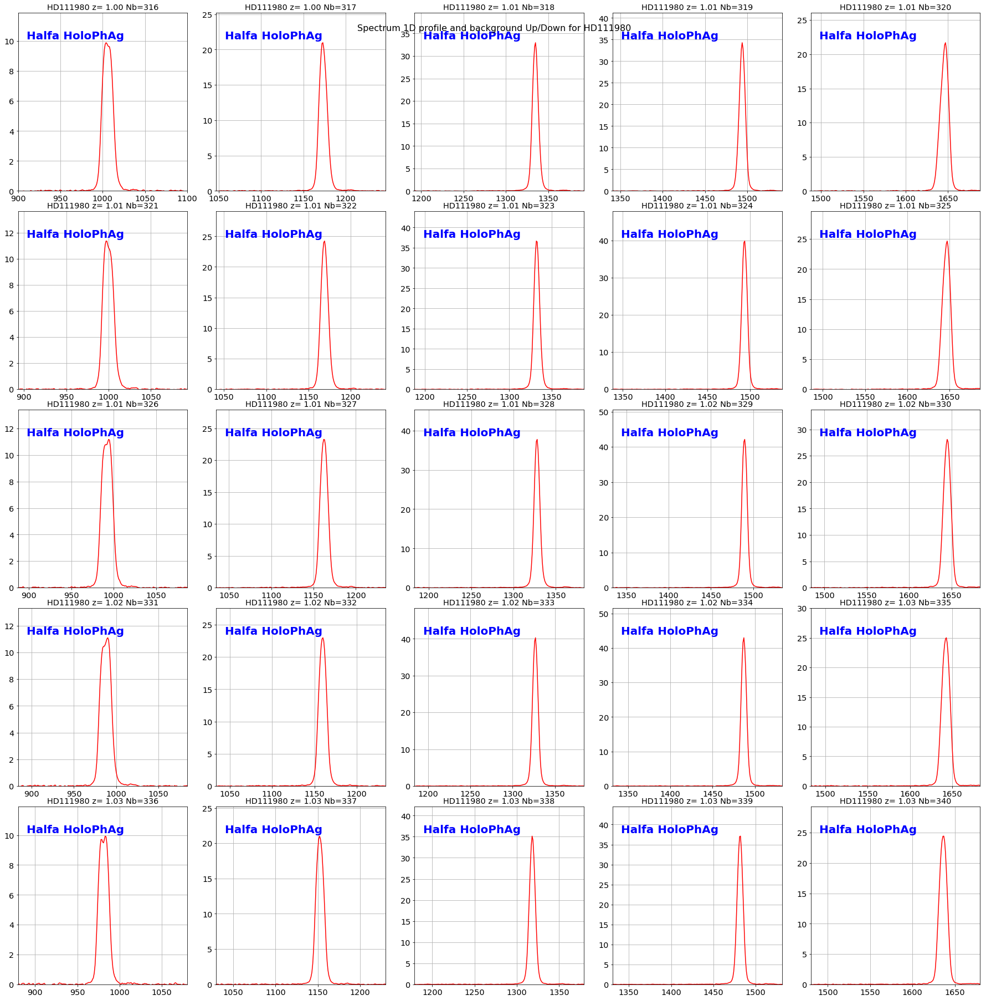

In [49]:
# Right spectrum profile
right_edge = thecorrspectra[0].shape[0]
xlims_right = []
for x in x_guess_right :
    if x == right_edge-1 :
        xlims_right.append([IMSIZE-2,IMSIZE-1])
    else :
        xlims_right.append([max(1,min(right_edge-2,int(x-100))),min(right_edge-1,int(x+100))])
ShowSpectrumProfile(thecorrspectra,all_titles,object_name,all_filt,NBIMGPERROW=5,xlim=xlims_right)

Halfa HoloPhAg:	 gaussian center x=1005.72+/-0.05
Halfa HoloPhAg:	 gaussian center x=1173.21+/-0.02
Halfa HoloPhAg:	 gaussian center x=1334.81+/-0.01
Halfa HoloPhAg:	 gaussian center x=1494.08+/-0.01
Halfa HoloPhAg:	 gaussian center x=1645.91+/-0.04
Halfa HoloPhAg:	 gaussian center x=999.36+/-0.06
Halfa HoloPhAg:	 gaussian center x=1168.86+/-0.01
Halfa HoloPhAg:	 gaussian center x=1332.47+/-0.01
Halfa HoloPhAg:	 gaussian center x=1493.78+/-0.01
Halfa HoloPhAg:	 gaussian center x=1646.15+/-0.03
Halfa HoloPhAg:	 gaussian center x=992.17+/-0.06
Halfa HoloPhAg:	 gaussian center x=1162.33+/-0.02
Halfa HoloPhAg:	 gaussian center x=1327.73+/-0.01
Halfa HoloPhAg:	 gaussian center x=1489.78+/-0.01
Halfa HoloPhAg:	 gaussian center x=1644.98+/-0.01
Halfa HoloPhAg:	 gaussian center x=987.62+/-0.06
Halfa HoloPhAg:	 gaussian center x=1159.72+/-0.02
Halfa HoloPhAg:	 gaussian center x=1326.75+/-0.01
Halfa HoloPhAg:	 gaussian center x=1486.91+/-0.01
Halfa HoloPhAg:	 gaussian center x=1642.38+/-0.02
Hal

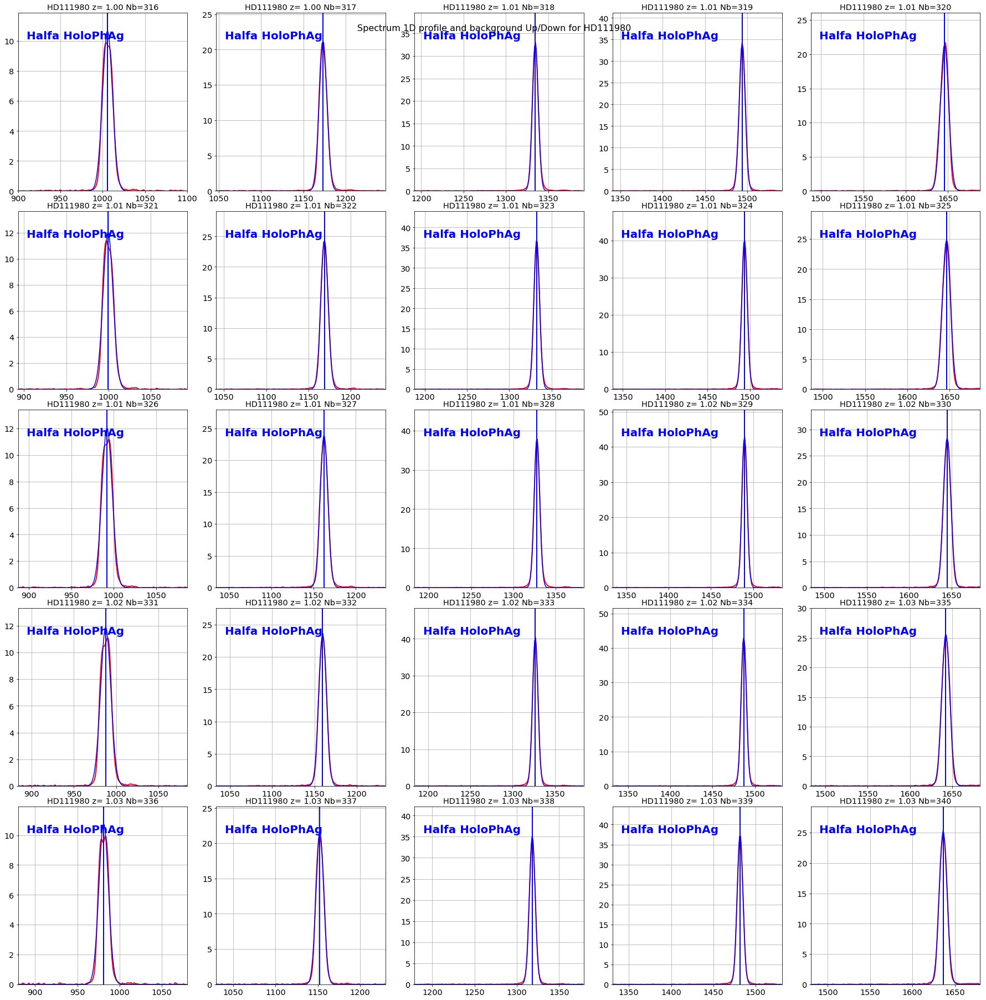

In [50]:
ShowSpectrumProfileFit(thecorrspectra,all_titles,object_name,all_filt,NBIMGPERROW=5,
                            xlim=xlims_right,guess=[10,1320,50])
figfilename=os.path.join(dir_top_images,'correctedspectrum_rightprofile2.pdf')
plt.savefig(figfilename)  

/opt/local/Library/Frameworks/Python.framework/Versions/2.7/lib/python2.7/site-packages/matplotlib/axes/_base.py:3193: UserWarning: Attempting to set identical bottom==top results
in singular transformations; automatically expanding.
bottom=0.0, top=0.0
  'bottom=%s, top=%s') % (bottom, top))


Halfa HoloPhAg:	 gaussian center x=117.32+/-0.28
Halfa HoloPhAg:	 gaussian center x=246.90+/-0.20
Halfa HoloPhAg:	 gaussian center x=385.73+/-0.11
Halfa HoloPhAg:	 gaussian center x=529.80+/-0.04
Halfa HoloPhAg:	 gaussian center x=110.49+/-0.38
Halfa HoloPhAg:	 gaussian center x=240.72+/-0.22
Halfa HoloPhAg:	 gaussian center x=380.34+/-0.12
Halfa HoloPhAg:	 gaussian center x=524.34+/-0.04
Halfa HoloPhAg:	 gaussian center x=104.36+/-0.38
Halfa HoloPhAg:	 gaussian center x=235.84+/-0.20
Halfa HoloPhAg:	 gaussian center x=375.58+/-0.11
Halfa HoloPhAg:	 gaussian center x=521.99+/-0.04
Halfa HoloPhAg:	 gaussian center x=104.72+/-0.39
Halfa HoloPhAg:	 gaussian center x=237.90+/-0.24
Halfa HoloPhAg:	 gaussian center x=376.14+/-0.13
Halfa HoloPhAg:	 gaussian center x=522.33+/-0.04
Halfa HoloPhAg:	 gaussian center x=104.45+/-0.38
Halfa HoloPhAg:	 gaussian center x=237.06+/-0.21
Halfa HoloPhAg:	 gaussian center x=378.13+/-0.13
Halfa HoloPhAg:	 gaussian center x=523.65+/-0.06


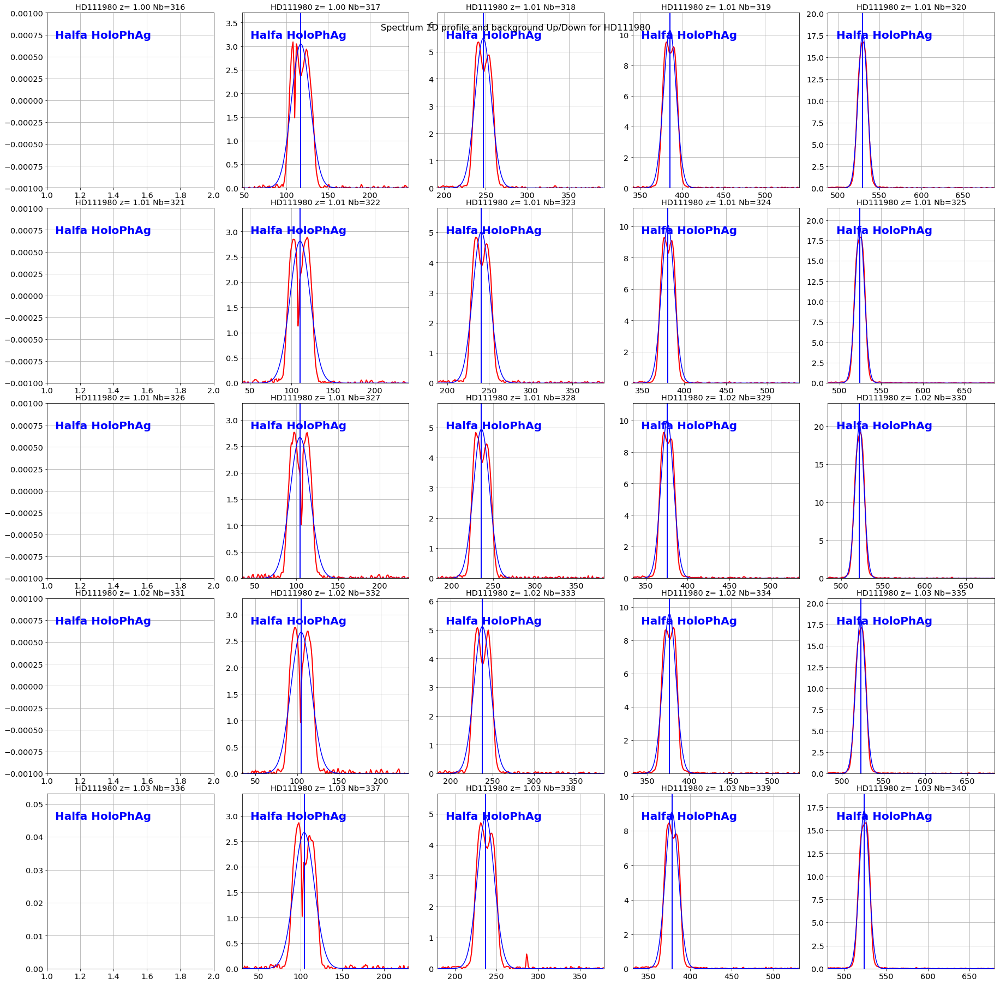

In [51]:
# Left profile
right_edge = thecorrspectra[0].shape[0]
xlims_left = []
for x in x_guess_left :
    if x == 1 :
        xlims_left.append([1,2])
    else :
        xlims_left.append([max(1,min(right_edge-2,int(x-100))),min(right_edge-1,int(x+100))])
ShowSpectrumProfileFit(thecorrspectra,all_titles,object_name,all_filt,NBIMGPERROW=5,
                            xlim=xlims_left,guess=[1,200,50])
figfilename=os.path.join(dir_top_images,'correctedspectrum_leftprofile2.pdf')
plt.savefig(figfilename)  

## Resolution of the hologram

With the +1 order only (-1 order is too unfocused)

In [160]:
guess = [1,1320,50]
N_rightorder, N_rightorder_err = GratingResolution_OneOrder(thecorrspectra,
                                        x_star,order0_positions,all_images,all_filt,xlims_right,guess,order=+1)

H-alpha filter center: 655.9nm 
H-alpha filter width: 6.4nm

Halfa HoloPhAg
N=325.8 +/- 1.1 lines/mm	 H-alpha FWHM=13.8pix with res=1.025nm/pix : FWHM=14.2nm	 ie finesse=84.4
Transverse profile FWHM=7.4pix 
-------------------------------
Halfa HoloPhAg
N=338.5 +/- 1.1 lines/mm	 H-alpha FWHM=10.8pix with res=0.907nm/pix : FWHM=9.8nm	 ie finesse=192.1
Transverse profile FWHM=5.4pix 
-------------------------------
Halfa HoloPhAg
N=348.3 +/- 1.1 lines/mm	 H-alpha FWHM=8.2pix with res=0.807nm/pix : FWHM=6.6nm	 ie finesse=3027.3
Transverse profile FWHM=5.4pix 
-------------------------------
Halfa HoloPhAg
N=354.8 +/- 1.2 lines/mm	 H-alpha FWHM=8.4pix with res=0.722nm/pix : FWHM=6.1nm	 ie finesse=-1958.7
Transverse profile FWHM=5.4pix 
-------------------------------
Halfa HoloPhAg
N=357.6 +/- 1.2 lines/mm	 H-alpha FWHM=11.5pix with res=0.654nm/pix : FWHM=7.5nm	 ie finesse=585.5
Transverse profile FWHM=5.1pix 
-------------------------------
Halfa HoloPhAg
N=326.0 +/- 1.1 lines/mm	 H-alpha

With the two orders

In [138]:
Ns, N_errs = GratingResolution_TwoOrder(thecorrspectra,all_images,all_filt,
                        leftorder_edges=xlims_left,rightorder_edges=xlims_right,guess=[[10,200,100],[1,1320,50]])

H-alpha filter center: 655.9nm 
H-alpha filter width: 6.4nm

Halfa HoloPhAg
N=339.6 +/- 1.1 lines/mm
Right order: H-alpha FWHM=10.8pix with res=1.191nm/pix : FWHM=12.9nm	 ie finesse=101.2
Left  order: H-alpha FWHM=26.6pix with res=1.191nm/pix : FWHM=31.6nm	 ie finesse=26.0
Transverse profile FWHM :  5.4pix (right)  10.0pix (left)
-------------------------------
Halfa HoloPhAg
N=349.4 +/- 1.1 lines/mm
Right order: H-alpha FWHM=8.2pix with res=1.163nm/pix : FWHM=9.5nm	 ie finesse=209.5
Left  order: H-alpha FWHM=23.0pix with res=1.163nm/pix : FWHM=26.8nm	 ie finesse=32.2
Transverse profile FWHM :  5.4pix (right)  8.0pix (left)
-------------------------------
Halfa HoloPhAg
N=355.6 +/- 1.2 lines/mm
Right order: H-alpha FWHM=8.4pix with res=1.145nm/pix : FWHM=9.6nm	 ie finesse=203.9
Left  order: H-alpha FWHM=18.0pix with res=1.145nm/pix : FWHM=20.6nm	 ie finesse=46.1
Transverse profile FWHM :  5.4pix (right)  6.2pix (left)
-------------------------------
Halfa HoloPhAg
N=358.0 +/- 1.2 lines

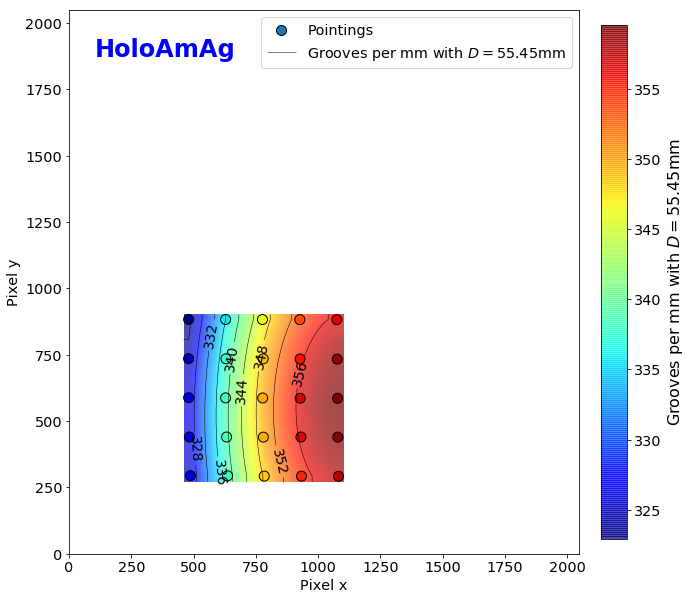

In [161]:
margin = 20

y_N = []
x_N = []
#d = []
N = []
for k in range(len(N_rightorder)):
    if np.isnan(N_rightorder[k]) : continue
    y_N.append((order0_positions.T)[1][k])
    x_N.append((order0_positions.T)[0][k])
    #d.append(distances[k])
    N.append(N_rightorder[k])
N_xx,N_yy,N_z,N_interp = scatter_interpol(np.array([x_N,y_N]).T,N,margin=margin,kind='cubic')

fig = plt.figure(figsize=(10,10))
plt.scatter(x_N, y_N, c=N, s=100, cmap=cm.jet, marker='o', vmin=np.min(N), vmax=np.max(N),edgecolors='k',label='Pointings')
im = plt.imshow(N_z, extent=[np.min(x_N)-margin, np.max(x_N)+margin, np.min(y_N)-margin, np.max(y_N)+margin],origin='lower',aspect='auto',alpha=0.7,cmap=cm.jet)
plt.xlabel('Pixel x')
plt.ylabel('Pixel y')
plt.annotate(holo_name,xy=(0.05,0.95),xytext=(0.05,0.95),horizontalalignment='left',
             verticalalignment='top',fontweight='bold',color='blue',fontsize=24,xycoords='axes fraction')
plt.xlim([0,IMSIZE])
plt.ylim([0,IMSIZE])

CS = plt.contour(N_xx,N_yy,N_z,10,linewidths=0.5,colors='k',label='Grooves per mm')
plt.clabel(CS, inline=1, fontsize=14,fmt='%d',fontweight='bold')
labels = ['Grooves per mm with $D=%.4g$mm' % DISTANCE2CCD]
for i in range(len(labels)):
    CS.collections[i].set_label(labels[i])
    
cb = fig.colorbar(im,fraction=0.046, pad=0.04)#, cax=cbar_ax)
#cb.formatter.set_powerlimits((0, 0))
cb.update_ticks()
cb.set_label('Grooves per mm with $D=%.4g$mm'% DISTANCE2CCD,fontsize=16)
plt.legend()
figfilename=os.path.join(dir_top_images,'%s_resolution.pdf' % holo_name)
plt.savefig(figfilename, bbox_inches='tight', rasterized=True, dpi=300)  
plt.show()

## Save grating resolution

In [162]:
N = []
Nerr = []
for k in range(len(N_rightorder)):
    if np.isnan(N_rightorder[k]): continue
    N.append(N_rightorder[k])
    Nerr.append(N_rightorder_err[k])
N_mean = np.mean(N)
N_mean_err = np.sqrt(np.mean(np.array(Nerr)**2))
print 'With distance to CCD = %.2f +/- %.2f mm' % (DISTANCE2CCD, DISTANCE2CCD_ERR)
print 'Average grooves per mm : %.2f +/- %.2f /mm (%.2f percent)' % (N_mean,N_mean_err,100*N_mean_err/N_mean)

dirname = "../../common_tools/data/"+holo_name
ensure_dir(dirname)
#print 'Save results in ',dirname
#np.savetxt(dirname+'/N.txt',[N_mean,N_mean_err])

With distance to CCD = 55.45 +/- 0.19 mm
Average grooves per mm : 345.06 +/- 1.12 /mm (0.33 percent)


## Save spectra

In [163]:
newfullfilenames=[]
for idx,file in np.ndenumerate(sorted_files):
    short_infilename=file.split("/")[2]
    short_partfilename=re.findall('^rotimg_(.*)',short_infilename)
    short_outfilename='finalSpectra_'+short_partfilename[0]
    newfullfilename=os.path.join(outputdir,short_outfilename)
    newfullfilenames.append(newfullfilename)

for idx,file in np.ndenumerate(newfullfilenames):
    prihdu = fits.PrimaryHDU(header=all_header[idx[0]],data=thecorrspectra[idx[0]])
    thdulist = fits.HDUList(prihdu)
    thdulist.writeto(file,clobber=True)
    
!ls -l spectrum_fitsspec

total 1600
-rw-r--r--  1 jneveu  staff  28800 11 aoû 14:58 finalSpectra_20170609_316.fits
-rw-r--r--  1 jneveu  staff  28800 11 aoû 14:58 finalSpectra_20170609_317.fits
-rw-r--r--  1 jneveu  staff  28800 11 aoû 14:58 finalSpectra_20170609_318.fits
-rw-r--r--  1 jneveu  staff  28800 11 aoû 14:58 finalSpectra_20170609_319.fits
-rw-r--r--  1 jneveu  staff  28800 11 aoû 14:58 finalSpectra_20170609_320.fits
-rw-r--r--  1 jneveu  staff  28800 11 aoû 14:58 finalSpectra_20170609_321.fits
-rw-r--r--  1 jneveu  staff  28800 11 aoû 14:58 finalSpectra_20170609_322.fits
-rw-r--r--  1 jneveu  staff  28800 11 aoû 14:58 finalSpectra_20170609_323.fits
-rw-r--r--  1 jneveu  staff  28800 11 aoû 14:58 finalSpectra_20170609_324.fits
-rw-r--r--  1 jneveu  staff  28800 11 aoû 14:58 finalSpectra_20170609_325.fits
-rw-r--r--  1 jneveu  staff  28800 11 aoû 14:58 finalSpectra_20170609_326.fits
-rw-r--r--  1 jneveu  staff  28800 11 aoû 14:58 finalSpectra_20170609_327.fits
-rw-r--r--  1 jneveu  staff  28800 11 aoû

## Analyse angles to find hologram center

### with line crossing

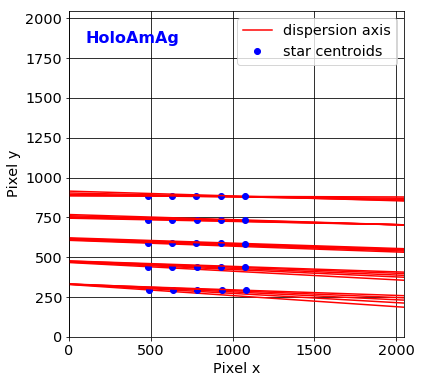

In [164]:
plot_dispersion_axis(order0_positions,all_theta,holo_name=holo_name)

Hologram center at x0 = 1081.7 and y0 = 610.1 with average tilt of -1.8 degrees


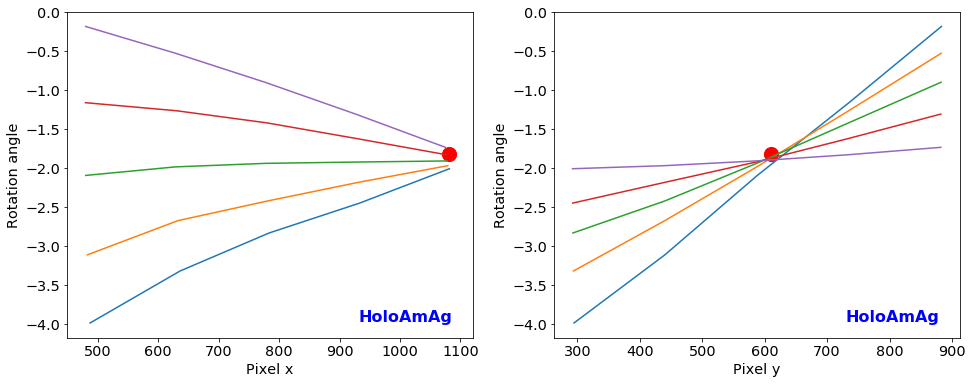

In [165]:
proj_x_lines, proj_y_lines = RotationLines(all_theta,order0_positions)
x_center, y_center, theta0 = FindHoloCenter(all_theta,order0_positions,proj_x_lines, proj_y_lines)

plot_rotation_lines(proj_x_lines,proj_y_lines,holo_name=holo_name,center=[x_center, y_center, theta0])

### with surface analysis

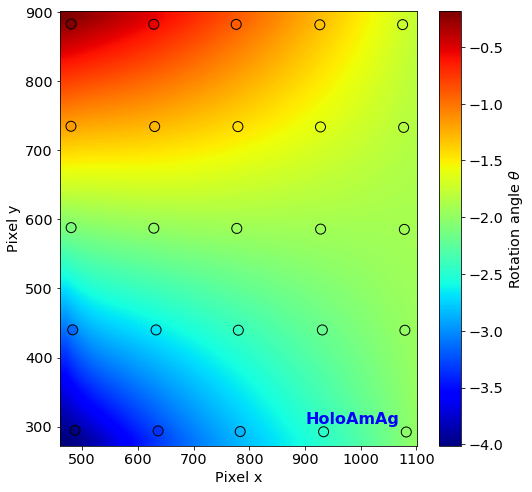

In [166]:
theta_xx,theta_yy,theta_z,theta_interp = scatter_interpol(order0_positions,all_theta,margin=10,kind='cubic',
                                        plot=True,holo_name=holo_name,zlabel='Rotation angle $\\theta$')

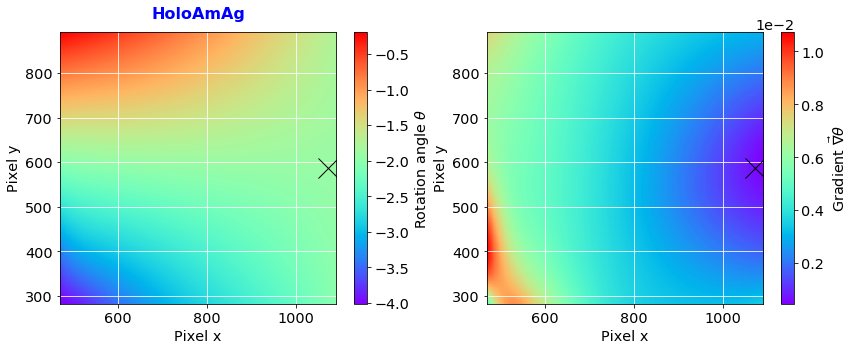

Minimum gradient of image: 0.000463051782364
Hessian determinant at minimum: -7.91590316582e-11 (if negative: saddle point)
Center at x0 = 1070.9 and y0 = 586.1 with average tilt of -1.91 degrees


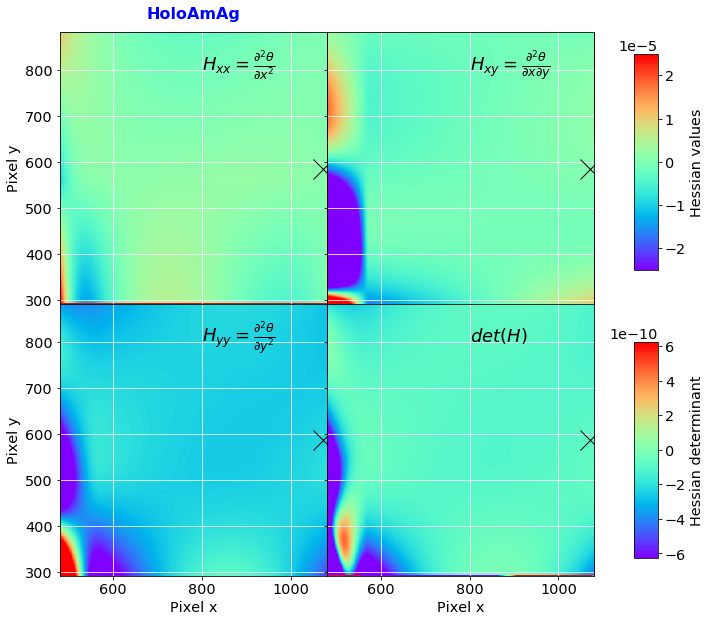

In [167]:
margin = 10

surface_gradient(theta_xx,theta_yy,theta_z,margin=margin,plot=True,holo_name=holo_name,dir_top_images=dir_top_images)

x_center, y_center, theta_tilt = saddle_point(theta_xx,theta_yy,theta_z,theta_interp,margin=margin,plot=True,verbose=True,
                                holo_name=holo_name,vmin=-0.000025,vmax=0.000025,dir_top_images=dir_top_images) 

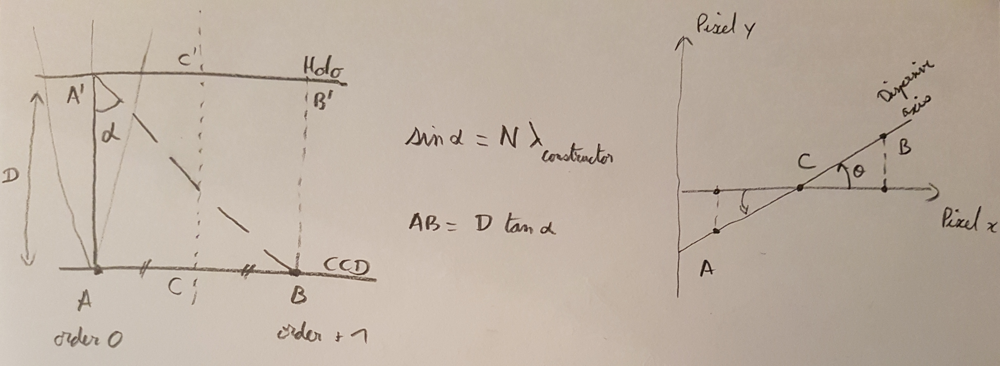

In [168]:
Image(filename='../../common_tools/pictures/hologram_centers.jpg')

Order  0 position at x0 = 805.1 and y0 = 595.0
Order +1 position at x0 = 1336.6 and y0 = 577.3
Distance between the orders: 531.79 pixels (12.76 mm)
-----------------------------
Load hologram HoloAmAg:
Plate center at x0 = 774.0 and y0 = 690.7 with average tilt of -1.9 degrees
Hologram center at x0 = 1070.9 and y0 = 586.1 with average tilt of -1.9 degrees
Order  0 position at x0 = 805.1 and y0 = 595.0
Order +1 position at x0 = 1336.6 and y0 = 577.3
Distance between the orders: 531.79 pixels (12.76 mm)
At order 0 position: N=351.08 grooves/mm and theta=-1.91 degrees


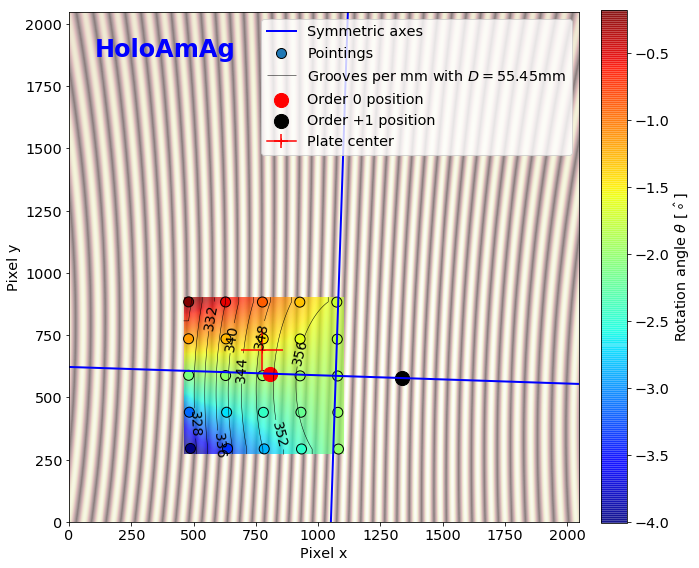

In [169]:
from holo_specs import *
xs, line1, line2 = neutral_lines(x_center,y_center,theta_tilt)
order0_position, order1_position, AB = find_order01_positions([x_center,y_center],N_interp,theta_interp)

print '-----------------------------'
H = Hologram(holo_name)

fig=plt.figure(figsize=(10,10))
# Background hologram shape
plt.imshow(H.hologram_shape,origin='lower', alpha=0.5, cmap=cm.pink)
# Pointings with rotation angle
x, y = np.array(order0_positions).T
plt.scatter(x, y, c=all_theta, label='Pointings',s=100, cmap=cm.jet, marker='o',vmin=np.min(all_theta), vmax=np.max(all_theta),edgecolors='k')
im = plt.imshow(theta_z, alpha=0.7,extent=[np.min(theta_xx)-margin, np.max(theta_xx)+margin, np.min(theta_yy)-margin, np.max(theta_yy)+margin],origin='lower',aspect='auto',cmap=cm.jet)
# Hologram resolution
CS = plt.contour(N_xx,N_yy,N_z,10,linewidths=0.5,colors='k',label='Grooves per mm')
plt.clabel(CS, inline=1, fontsize=14,fontweight='bold',fmt='%d')
labels = ['Grooves per mm with $D=%.4g$mm' % DISTANCE2CCD]
for i in range(len(labels)):
    CS.collections[i].set_label(labels[i])
# Hologram geometry
plt.plot(xs,line1,'b-',label='Symmetric axes',lw=2)
plt.plot(xs,line2,'b-',lw=2)
plt.scatter(order0_position[0],order0_position[1],s=200,facecolor='red',label='Order 0 position')
plt.scatter(order1_position[0],order1_position[1],s=200,facecolor='black',label='Order +1 position')
plt.errorbar(0.5*IMSIZE+PLATE_CENTER_SHIFT_X/PIXEL2MM,0.5*IMSIZE+PLATE_CENTER_SHIFT_Y/PIXEL2MM,xerr=PLATE_CENTER_SHIFT_X_ERR/PIXEL2MM,yerr=PLATE_CENTER_SHIFT_Y_ERR/PIXEL2MM,marker='+',color='red',label='Plate center')
# Axis and colobar settings
plt.xlabel('Pixel x')
plt.ylabel('Pixel y')
plt.annotate(holo_name,xy=(0.05,0.95),xytext=(0.05,0.95),fontsize=24,verticalalignment='top',
                  fontweight='bold',color='blue',horizontalalignment='left',xycoords='axes fraction')
plt.xlim([0,IMSIZE])
plt.ylim([0,IMSIZE])
plt.gca().set_aspect('equal', adjustable='box')
#divider = make_axes_locatable(ax)
#cax = divider.append_axes("right", size="5%", pad=0.05)
cb = fig.colorbar(im,fraction=0.046, pad=0.04)#, cax=cbar_ax)
cb.formatter.set_powerlimits((0, 0))
cb.update_ticks()
cb.set_label('Rotation angle $\\theta$ [$\^\circ$]') #,fontsize=16)
plt.legend()
figfilename=os.path.join(dir_top_images,'%s_geometry.pdf' % holo_name)
plt.savefig(figfilename, bbox_inches='tight', rasterized=True, dpi=300)  
plt.show()

The two methods are coherent.

## Save results

In [170]:
dirname = "../../common_tools/data/"+holo_name
ensure_dir(dirname)
print 'Save results in ',dirname
print '--------------------------------------------------------------'
textfilename=os.path.join(dirname,'hologram_rotation_angles.txt')
print textfilename
out = []
for index in range(len(all_theta)):
    out.append([order0_positions[index][0], order0_positions[index][1], all_theta[index]])
np.savetxt(textfilename,np.array(out),header="x_star y_star theta_in_degree",fmt='%.3f')

textfilename=os.path.join(dirname,'hologram_grooves_per_mm.txt')
print textfilename
out = []
for index in range(len(all_theta)):
    out.append([order0_positions[index][0], order0_positions[index][1], N_rightorder[index]])
np.savetxt(textfilename,np.array(out),header="x_star y_star grooves_per_mm grooves_per_mm_err",fmt='%.3f')

text = "#x_center y_center theta_tilt_in_degree\n" 
text += "%.3f %.3f %.3f\n" % (x_center, y_center, theta_tilt)
textfilename = dirname+"/hologram_center.txt"
print textfilename
f=open(textfilename,'w')
f.write(text)
f.close()

Save results in  ../../common_tools/data/HoloAmAg
--------------------------------------------------------------
../../common_tools/data/HoloAmAg/hologram_rotation_angles.txt
../../common_tools/data/HoloAmAg/hologram_grooves_per_mm.txt
../../common_tools/data/HoloAmAg/hologram_center.txt


In [171]:
print 'Test:'
print '--------------------------------------------------------------'
H = Hologram(holo_name)

Test:
--------------------------------------------------------------
Load hologram HoloAmAg:
Plate center at x0 = 774.0 and y0 = 690.7 with average tilt of -1.9 degrees
Hologram center at x0 = 1070.9 and y0 = 586.1 with average tilt of -1.9 degrees
Order  0 position at x0 = 805.1 and y0 = 595.0
Order +1 position at x0 = 1336.6 and y0 = 577.3
Distance between the orders: 531.79 pixels (12.76 mm)
At order 0 position: N=351.08 grooves/mm and theta=-1.91 degrees
